#**Gradient Descent**<br>
First, let's upload the modules that we need.

##**Functions to be used for this workbook**

In [1]:
## function that adds random values to the vertical axis
## so that the data set looks random
def addrandomfluctuations(x,m,b,fluctuationsize):
  import random

  yrand = np.zeros(len(x))
  for i in range(len(x)):
    yrand[i] = m*x[i] + b + fluctuationsize*(random.random()-0.5)

  return yrand

In [2]:
## function that computes the cost function
def costfunction(x,y,th0,th1):
  n = len(y)

  J = np.zeros([len(th0),len(th1)])
  for i in range(len(th0)):
    for j in range(len(th1)):
      J[i,j] = (1/(2*n))*np.sum(np.power((th0[i] + th1[j]*x - y),2))

  return J

In [3]:
def plot_costfunction_2D(x,y,th0,th1,J,time):

  for i in range(len(th0)):
    for j in range(len(th1)):
      fig, ax = plt.subplots(1,2,figsize=(16,8))
      ylr = addrandomfluctuations(x,th1[j],th0[i],0)
      ax[0].plot(x,ylr,'r', linewidth=5)
      ax[0].plot(x,y,'bx', markersize=10,linewidth=2)
      ax[0].set_xlim(0,5)
      ax[0].set_ylim(0,12)
      plt.xlabel('x')
      plt.ylabel('y')

      if th1.shape[0] == 1:
        ax[1].plot(th0[:i],J[:i,j],'bx', markersize=10,linewidth=2)
        plt.xlabel(r'$\theta_0$')
        plt.ylabel('Cost Function, J')
        plt.axis([-2,2,0,4])
      else:
        ax[1].plot(th1[:j],J[i,:j],'bx', markersize=10,linewidth=2)
        plt.xlabel(r'$\theta_1$')
        plt.ylabel('Cost Function, J')
        plt.axis([0,4,0,20])


  plt.show()
  # plt.pause(time)

In [4]:
def plot_costfunction_3D(x,y,theta0,theta1,J,th0,th1,time):

  for i in range(len(th0)):
    for j in range(len(th1)):
      fig = plt.figure(figsize=(16,8))
      plt.axis([0,5,0,12])
      ax = fig.add_subplot(1,2,1)
      ylr = addrandomfluctuations(x,th1[j],th0[i],0)
      ax.plot(x,ylr,'r', linewidth=5)
      ax.plot(x,y,'bx', markersize=10,linewidth=2)
      plt.xlabel('x')
      plt.ylabel('y')

      ax = fig.add_subplot(1,2,2, projection = '3d')
      surf = ax.plot_wireframe(theta0,theta1,(J),cmap=cm.Spectral,antialiased=True)
      # Jcost = (1/(2*len(y)))*np.sum(np.power((th0[i] + th1[j]*x - y),2))
      scatter2 = ax.scatter(th0[i],th1[j],J[i,j],c='k',marker='o',linewidth=5)
      ax.view_init(30, 30)
      ax.set_xlabel(r'$\theta_0$')
      ax.set_ylabel(r'$\theta_1$')
      ax.set_zlabel(r'Cost Function, J')

      plt.pause(time)
  plt.show()

In [5]:
def gradient_descent(x,y,init0,init1,iter,a,time):
  t0 = np.zeros([iter])
  t1 = np.zeros([iter])
  gradJcost0 = np.zeros([iter])
  gradJcost1 = np.zeros([iter])
  Jcost = np.zeros([iter])
  t0[0] = init0
  t1[0] = init1

  n = len(y)
  theta0 = np.arange(-2,2,0.1)
  theta1 = np.arange(0,4,0.1)
  J = costfunction(x,y,theta0,theta1)

  for i in range(iter-1):
    print(t0[i])

    fig = plt.figure(figsize=(16,8))
    # plt.axis([0,5,0,12])
    ax = fig.add_subplot(1,2,1)
    ylr = addrandomfluctuations(x,t1[i],t0[i],0)
    ax.plot(x,ylr,'r', linewidth=5)
    ax.plot(x,y,'bx', markersize=10,linewidth=2)
    plt.xlabel('x')
    plt.ylabel('y')

    ax = fig.add_subplot(1,2,2,projection = '3d')
    surf = ax.plot_wireframe(theta0,theta1,(J),cmap=cm.Spectral,antialiased=True)
    Jcost[i] = (1/(2*len(y)))*np.sum(np.power((t0[i] + t1[i]*x - y),2))
    scatter2 = ax.scatter(t0[i],t1[i],Jcost,c='k',marker='o',linewidth=5)
    ax.view_init(50, 10)
    ax.set_xlabel(r'$\theta_0$')
    ax.set_ylabel(r'$\theta_1$')
    ax.set_zlabel(r'Cost Function, J')

    plt.pause(time)

    # Solve for the derivative
    gradJcost0[i] = (1/n)*sum(t0[i] + t1[i]*x - y)
    gradJcost1[i] = (1/n)*sum( (t0[i] + t1[i]*x - y)*x )

    # Get new values of the parameters
    t0[i+1] = t0[i] - a*gradJcost0[i]
    t1[i+1] = t1[i] - a*gradJcost1[i]

  plt.show()
  return Jcost

##**Importing the Modules**

In [6]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation
from matplotlib.animation import PillowWriter
from matplotlib import cm
import seaborn as sb

##**Preparing the Dataset**

Consider this relation between two variables, $x$ and $y$.

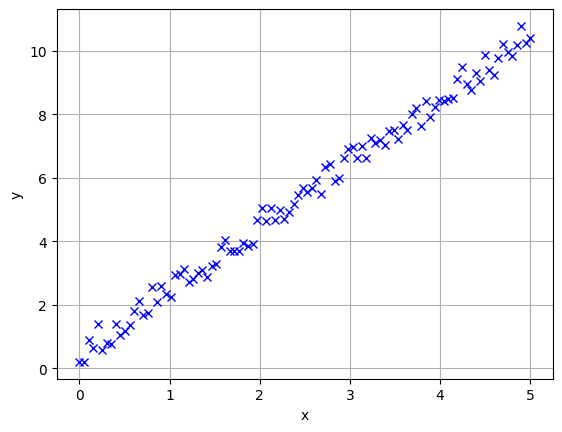

In [7]:
m = 2
b = 0.5
fluctuationsize = 1

x = np.linspace(0,5,100)
y = addrandomfluctuations(x,m,b,fluctuationsize)
plt.plot(x,y,'bx')
plt.xlabel('x')
plt.ylabel('y')
plt.grid()

*Figure 2.1. A data set that forms a straight line.*

##**The Cost Function**<br>


The cost function describes is a measure of the error between the expected value and the measured value. The higher the error, the more it "costs" to correct the error. Thus, the goal is to minimize the error, and therefore, the cost function. <br>
Consider the linear given data set plotted against the best fit line. For this example, the cost function, $J(\theta_0,\theta_1)$, is given by the expression<br>
$J(\theta_0,\theta_1)=\frac{1}{2n}\sum_{i=1}^{n} [(\theta_0 + \theta_1 x_i)-y_i]^2$<br>
where $(\theta_0 + \theta_1 x_i)$ is the equation of the best fit line described by its slope, $\theta_1$, and y-intercept, $\theta_0$, and  is the measured value at the $i^{th}$ data point. Thus, the term in the square brackets $(\theta_0 + \theta_1 x_i)-y_i$ corresponds to the difference between the best fit line and the measured values. When the cost function is minimized, we have the optimum value for the slope, $\theta_1$, and y-intercept, $\theta_0$, and the term  is small as it could be for each data point. In Figure 2.2, the term  is the value between each of the blue crosses and the value of the best fit line corresponding to $x_i$.

Text(0, 0.5, 'y')

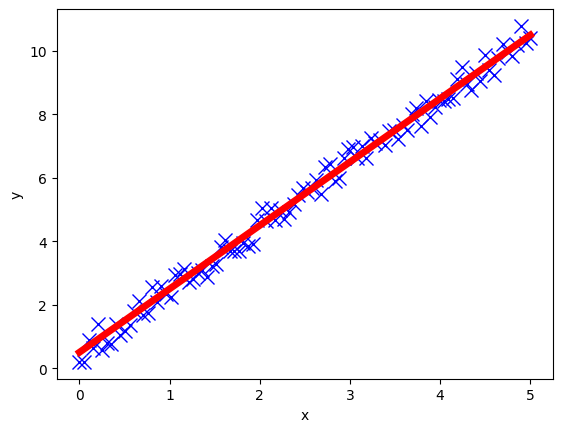

In [8]:
plt.plot(x,y,'bx', markersize=10,linewidth=2)
ylr = addrandomfluctuations(x,m,b,0)
plt.plot(x,ylr,'r', linewidth=5)
plt.xlabel('x')
plt.ylabel('y')
# plt.axis([0, 0.5, 0, 2])

*Figure 2.2. The difference between the blue crosses and the red line at each data point, $x_i$, corresponds to the term $(\theta_0 + \theta_1 x_i)-y_i$.*

Let's also display the first few data points by assigning the datasets to a table.

In [9]:
from tabulate import tabulate

T = [[x,y]]
print(tabulate(T,headers=['X Data','Y Data']))

X Data                                                              Y Data
------------------------------------------------------------------  ------------------------------------------------------------------------
[0.         0.05050505 0.1010101  0.15151515 0.2020202  0.25252525  [ 0.20087907  0.19640234  0.89575808  0.61964985  1.3983662   0.58772847
 0.3030303  0.35353535 0.4040404  0.45454545 0.50505051 0.55555556    0.78035214  0.7715002   1.40010348  1.05236725  1.15578288  1.36128076
 0.60606061 0.65656566 0.70707071 0.75757576 0.80808081 0.85858586    1.80758273  2.1023134   1.66207095  1.73595143  2.54743495  2.10039668
 0.90909091 0.95959596 1.01010101 1.06060606 1.11111111 1.16161616    2.60012784  2.32191725  2.23110004  2.93955071  2.95671311  3.11584254
 1.21212121 1.26262626 1.31313131 1.36363636 1.41414141 1.46464646    2.71231016  2.82330825  2.99665029  3.10924138  2.86133289  3.2318546
 1.51515152 1.56565657 1.61616162 1.66666667 1.71717172 1.76767677    3.28437117

/usr/local/lib/python3.10/dist-packages/tabulate/__init__.py:107: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  (len(row) >= 1 and row[0] == SEPARATING_LINE)
/usr/local/lib/python3.10/dist-packages/tabulate/__init__.py:108: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  or (len(row) >= 2 and row[1] == SEPARATING_LINE)


Let's try to understand what is happening here and what it means to our data when we minimize one of these parameters. Let's set the y-intercept to $\theta_0=0.5$ and then vary the slope of the line, $\theta_1$. While we vary the slope, we take a look at the cost function.<br>
Watch this video and try to figure out what the value of $\theta_1$ is that minimizes the cost function. The function *costfunction()* is defined at the end of this script and solves for the costfunction. To plot the result, we defined the plot_costfunction_2D() located at the end of this script. Here the y-intercept is fixed and the slope is varied. So, the red line is fixed at one end and just sweeps over an area on the graph eventually passing through all the data points neatly, which corresponds to when the cost function has a minimum value.

<ipython-input-3-100ed8cf4dc6>:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(1,2,figsize=(16,8))


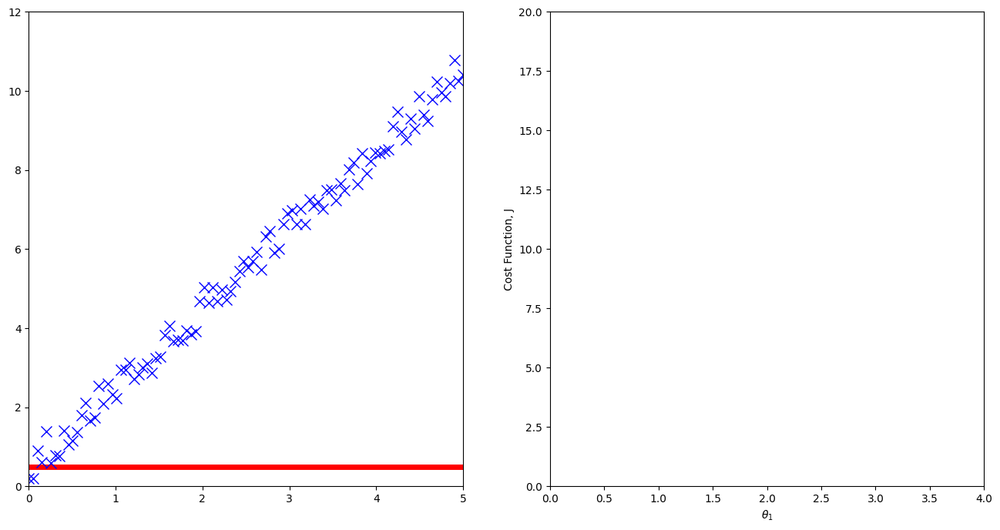

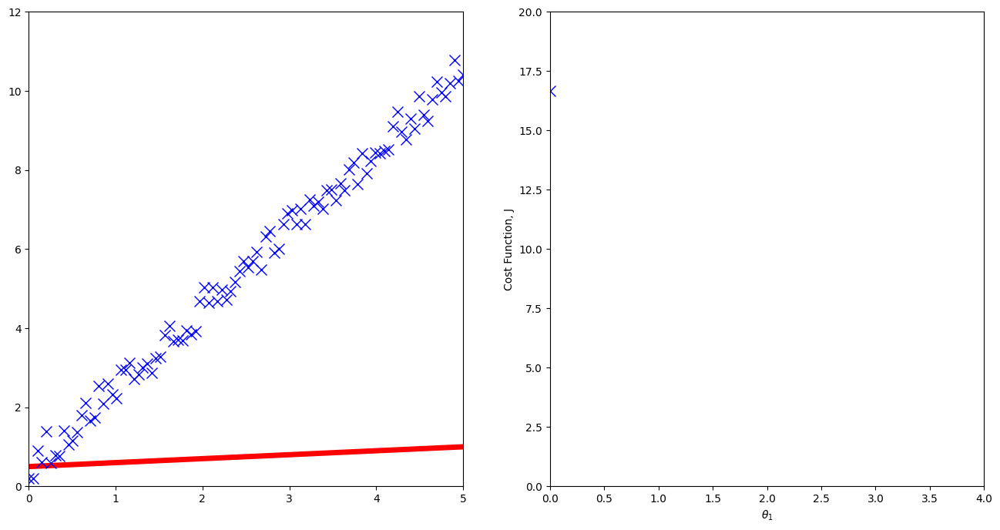

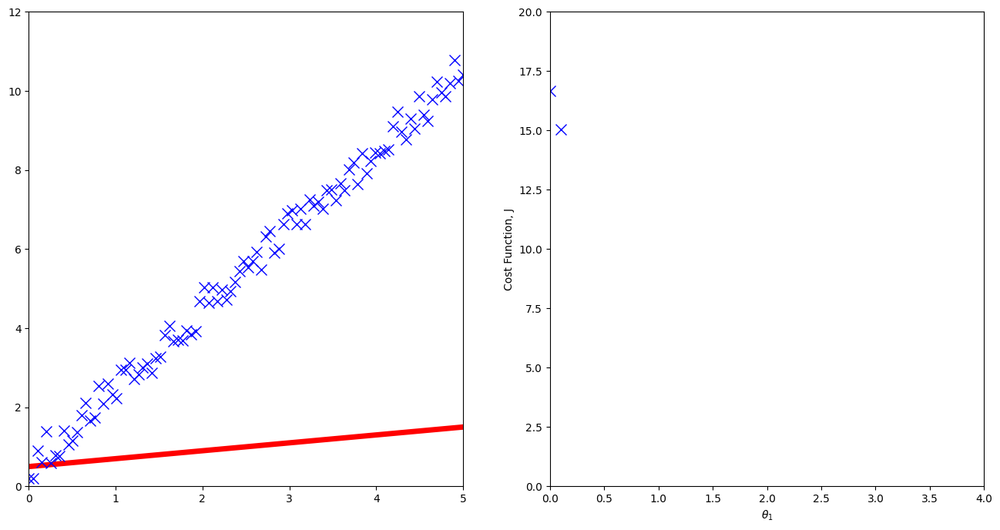

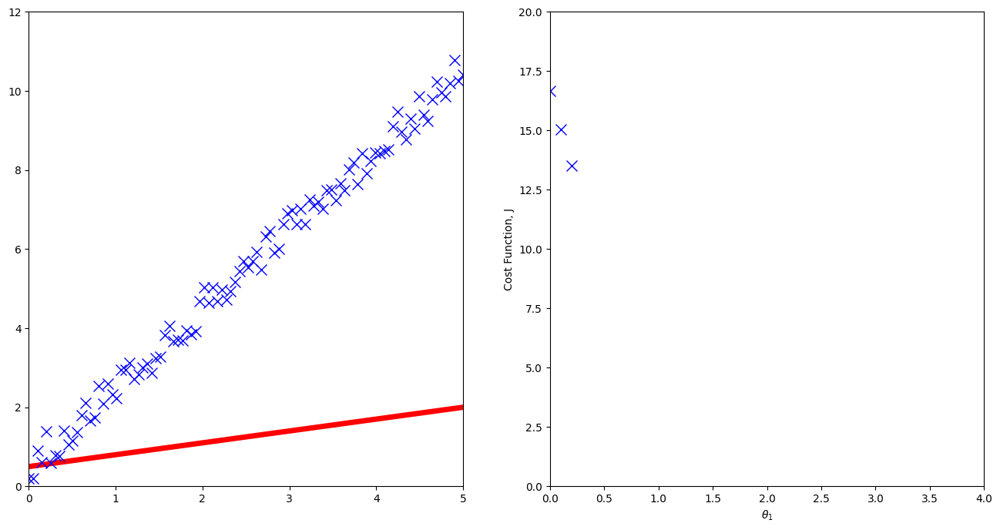

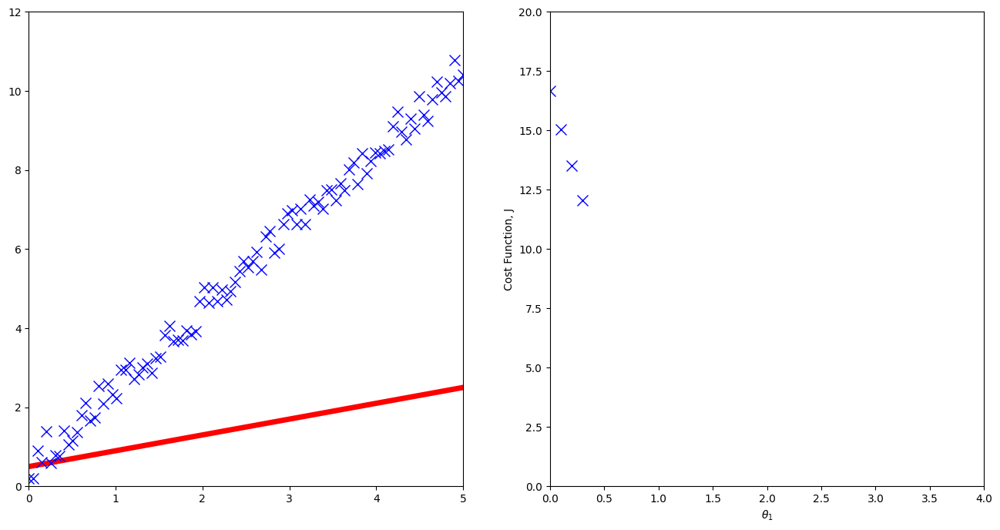

...

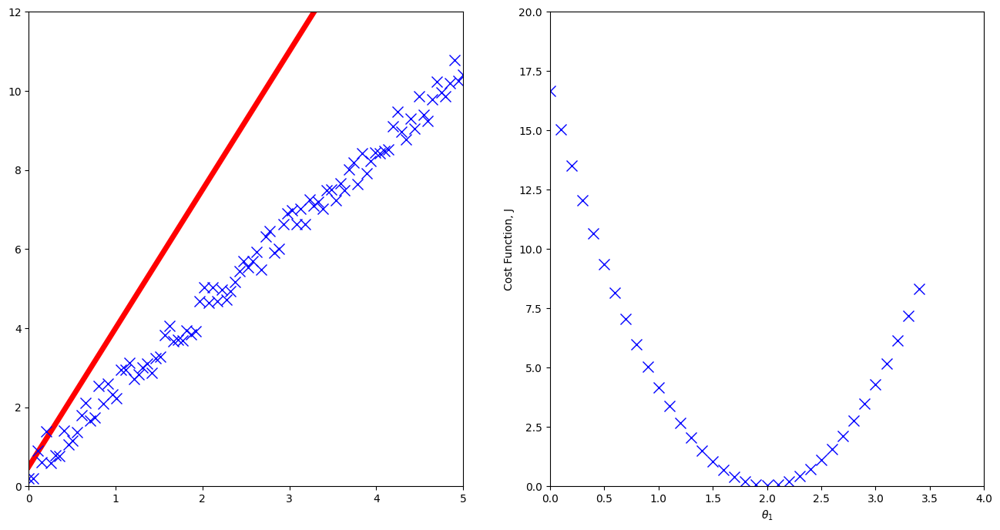

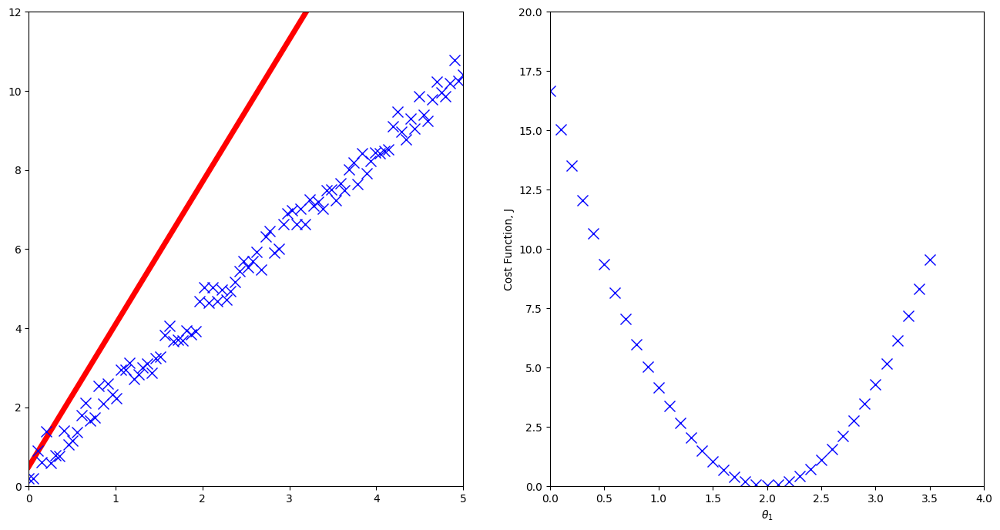

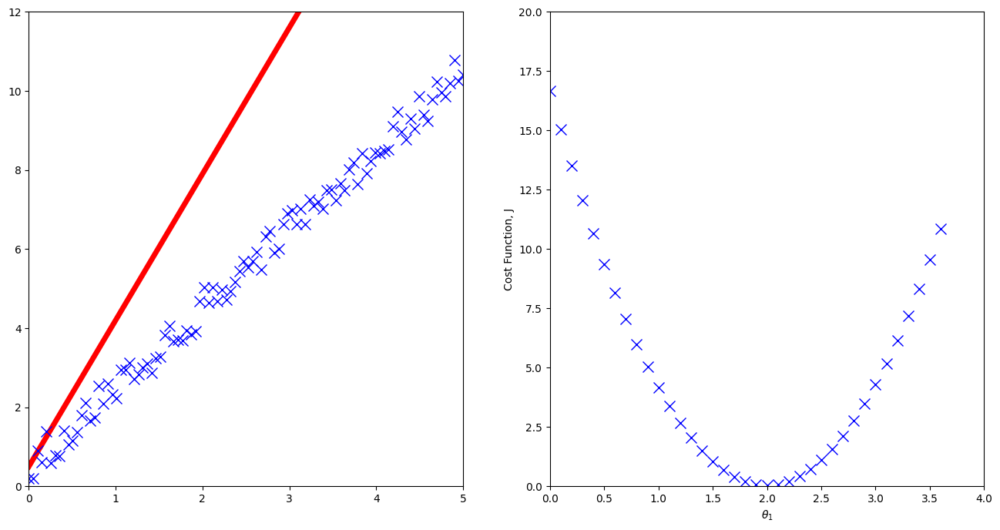

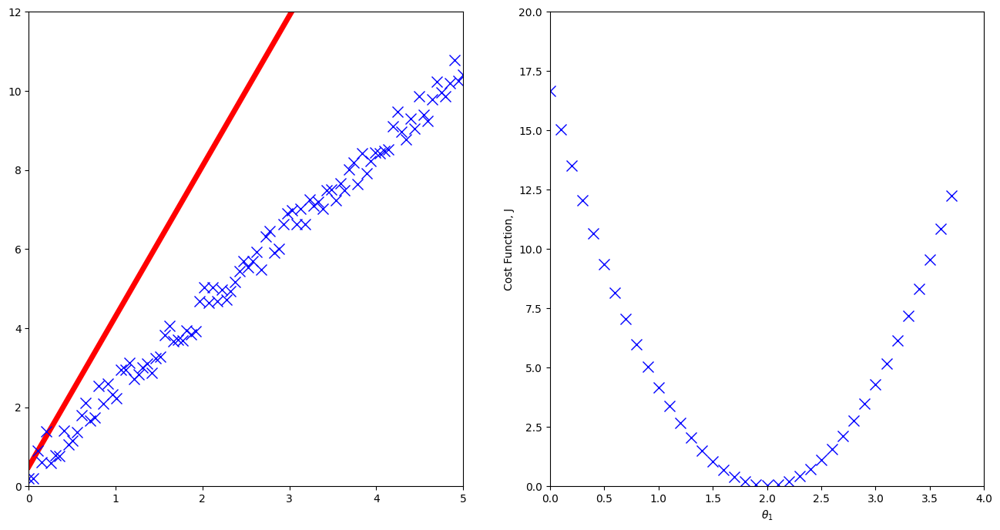

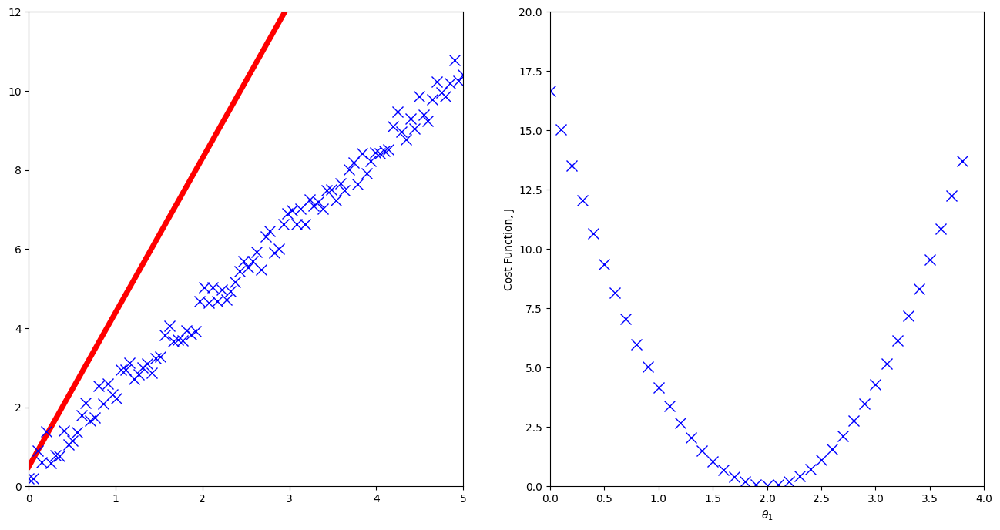

In [10]:
theta0 = np.array([0.5])
theta1 = np.arange(0,4,0.1)
time = 0.2

J = costfunction(x,y,theta0,theta1)
K = plot_costfunction_2D(x,y,theta0,theta1,J,time)

##**The Derivative of the Cost Function**


How do we determine the minimum value of the cost function? We use gradient descent to determine the fastest way to the minimum value from a given set of initial parameters or initial guesses. To perform gradient descent, we need to take the derivative of the cost function with respect to the parameters, $\theta_0$ and $\theta_1$. We get the following expressions:<br>
$\frac{\partial J(\theta_0,\theta_1)}{\partial \theta_0} = \frac{1}{n} \sum_{i=1}^{n} [(\theta_0 + \theta_1 x_i)-y_i]$ and $\frac{\partial J(\theta_0,\theta_1)}{\partial \theta_1} = \frac{1}{n} \sum_{i=1}^{n} [(\theta_0 + \theta_1 x_i)-y_i]x_i$.<br>
These derivatives point towards the greatest change in the cost function along the direction of the parameters. Thus, in one iteration, we get a new guess for the optimum value by subtracting these values from the initial guesses. In other words,<br>
$\theta_0 - \alpha \frac{\partial J(\theta_0,\theta_1)}{\partial \theta_0} \rightarrow \theta_0$ and $\theta_1 - \alpha \frac{\partial J(\theta_0,\theta_1)}{\partial \theta_1} \rightarrow \theta_1$.<br>
Using those new values, we get a new set of gradients, which we then subtract again from these new guesses to get a third guess. We do this iteratively until the gradient becomes very small or until after a specified number of iterations. The implementation of the gradient descent can be seen in the *gradient_descent()* function at the end of the script.

-2.0


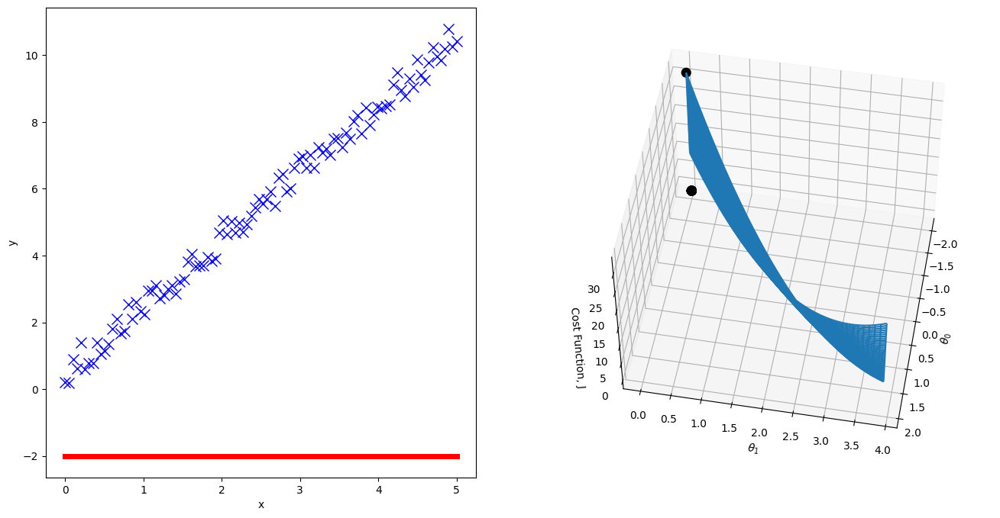

-0.8806960470094898


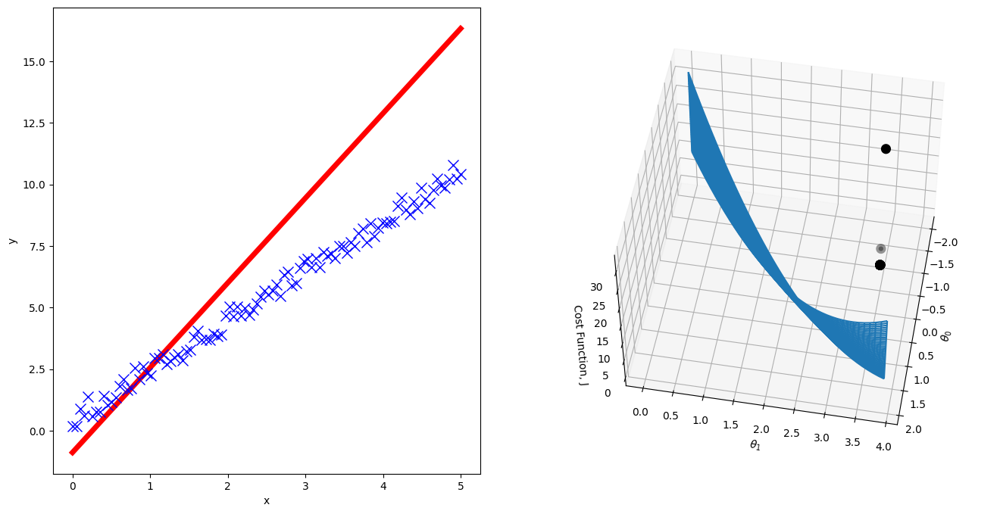

-1.2198880402764574


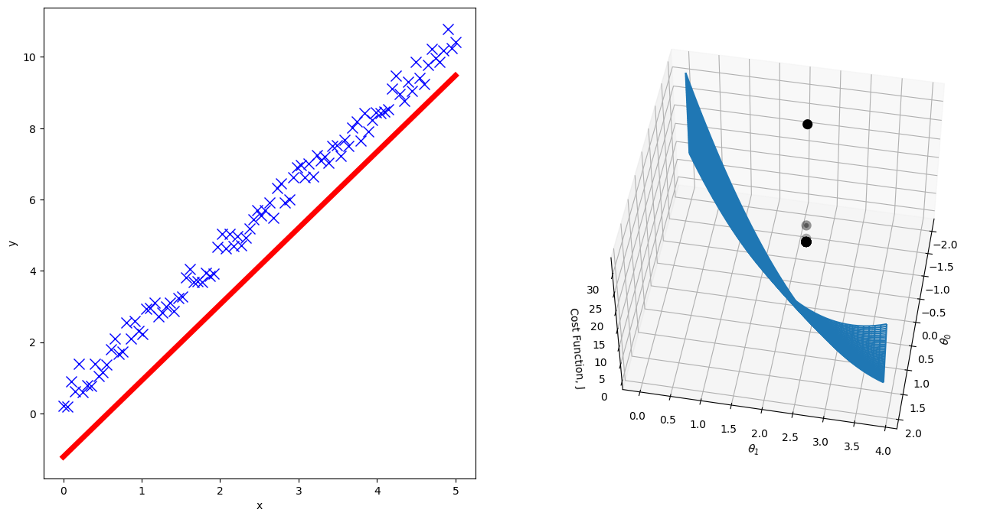

-1.0200012983336515


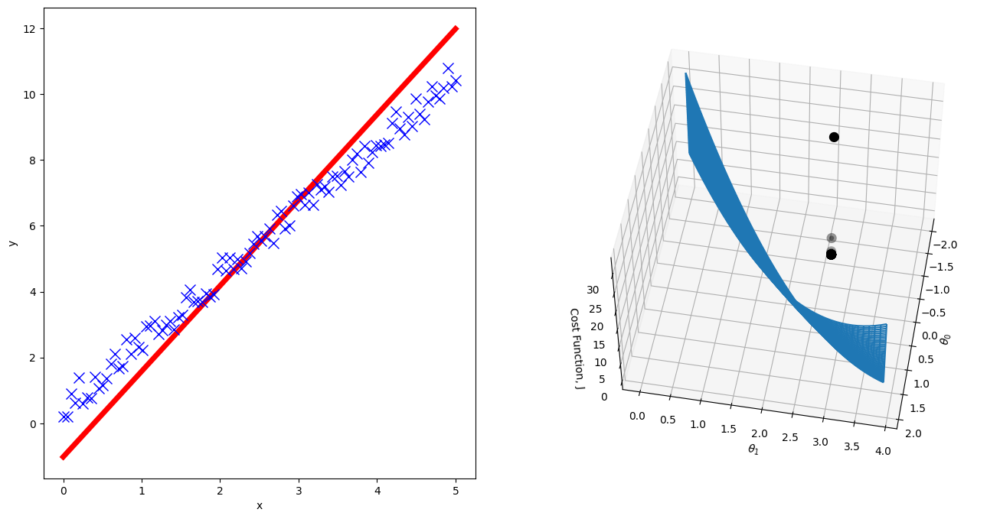

-1.022928496094783


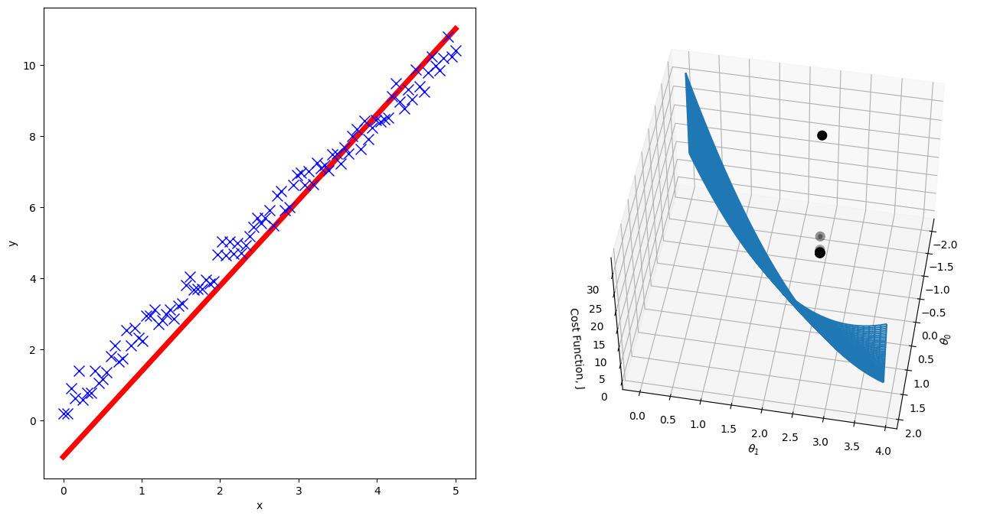

-0.9530087046568703


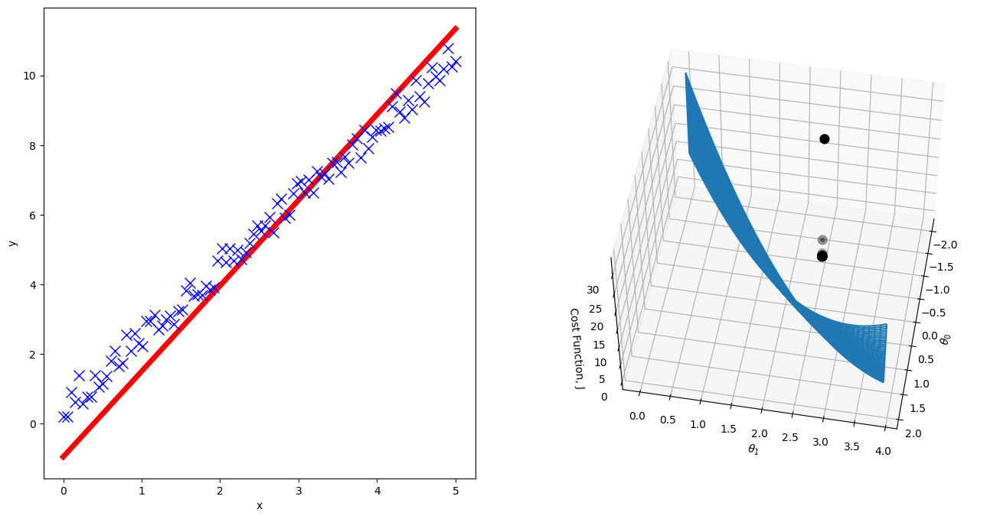

-0.9125476171445253


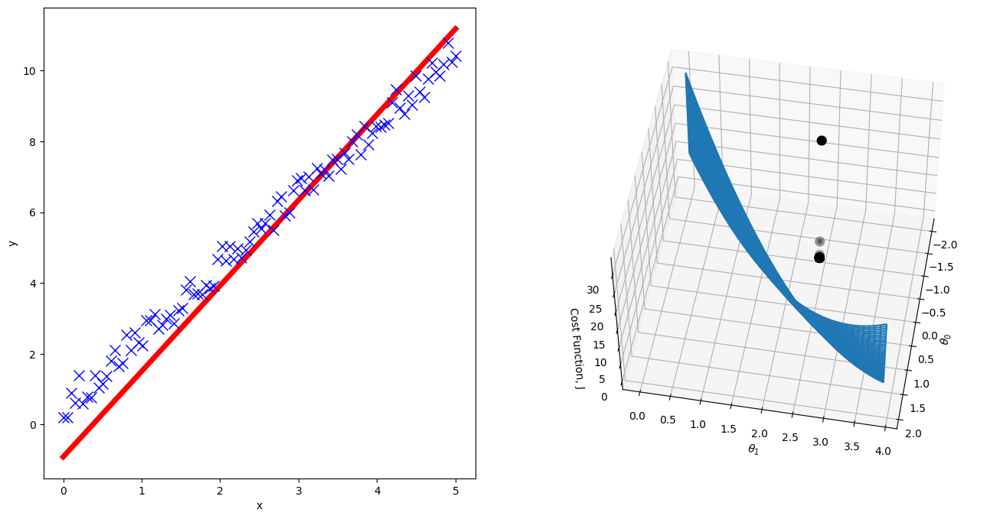

-0.8634607735431186


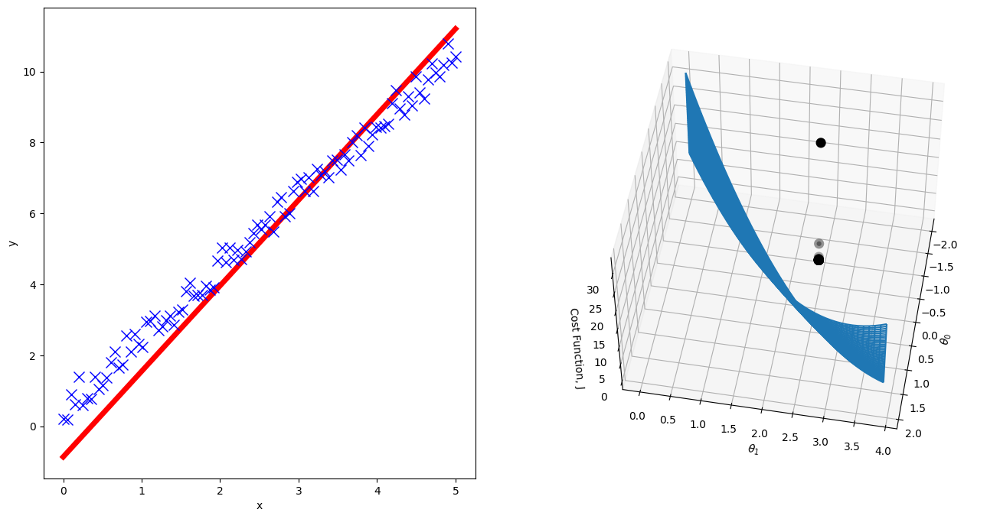

-0.8198136168091238


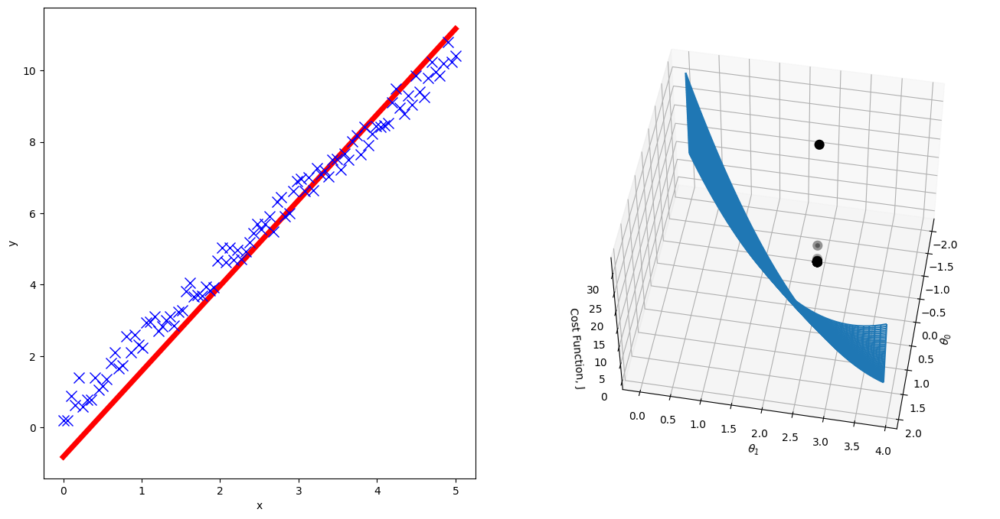

-0.7763036734178943


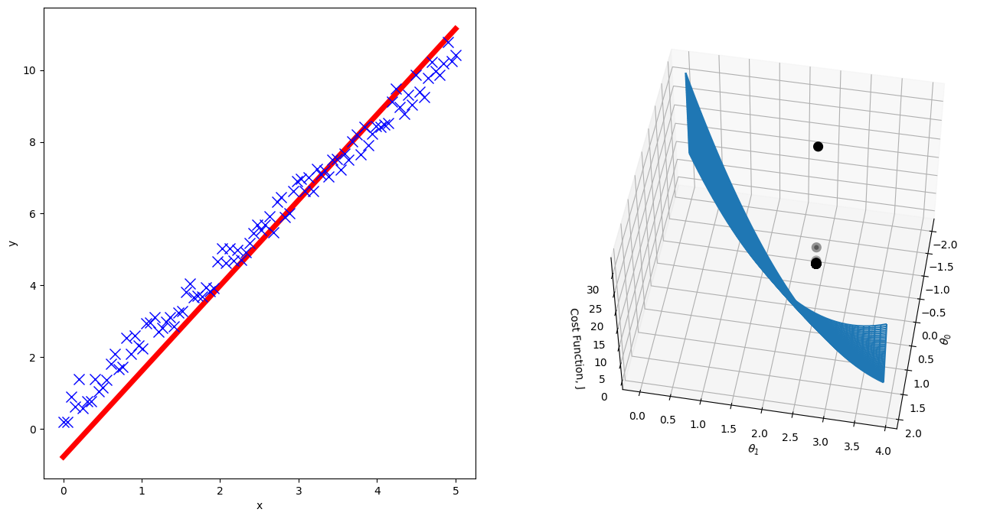

-0.7348252714503999


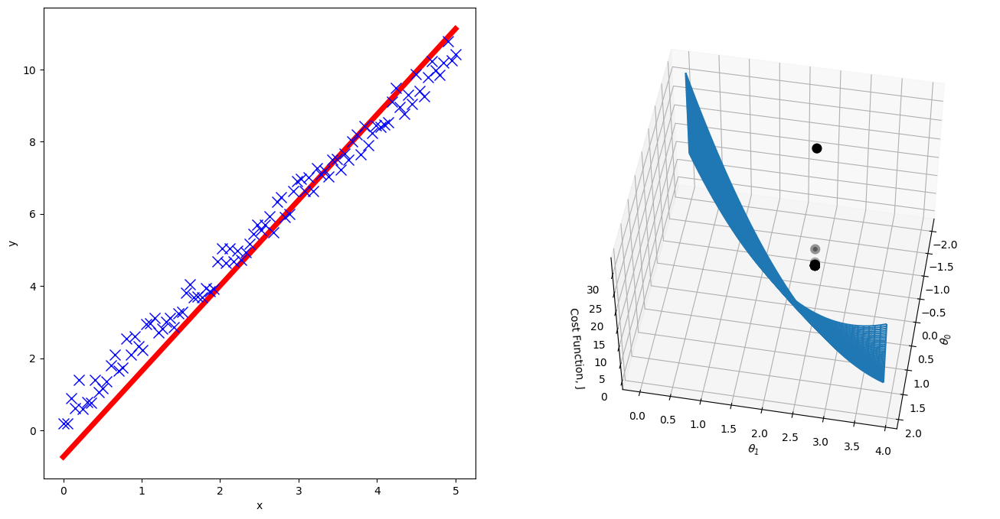

-0.6946021587200075


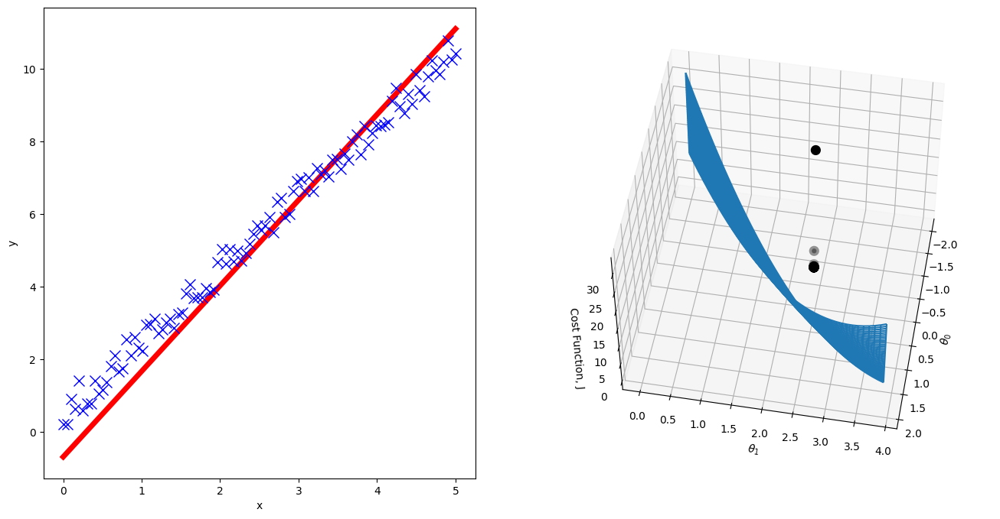

-0.6558525843709527


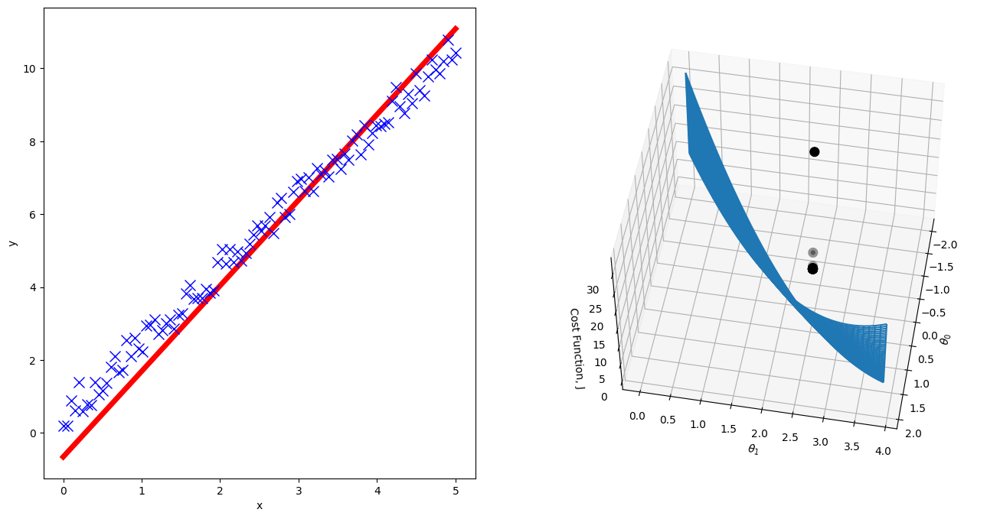

-0.6184278405061773


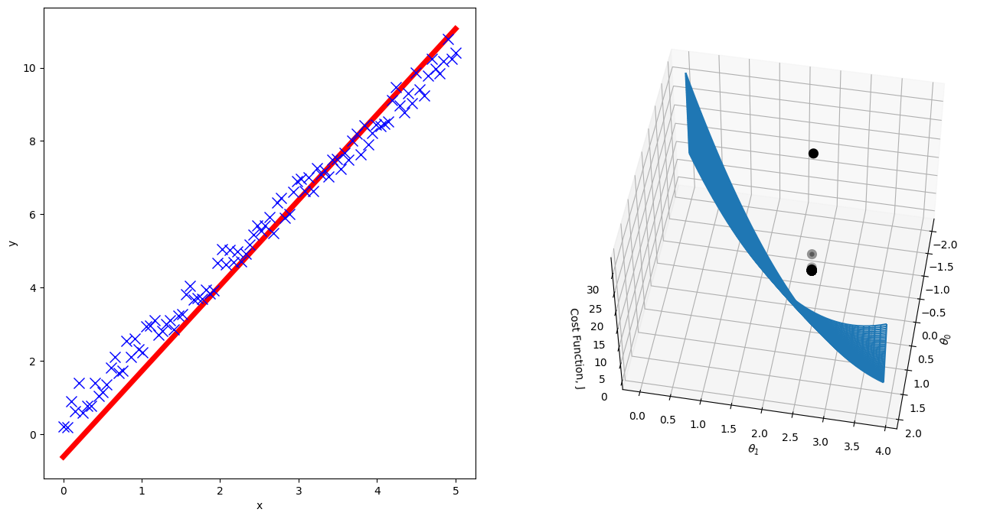

-0.5823178815891661


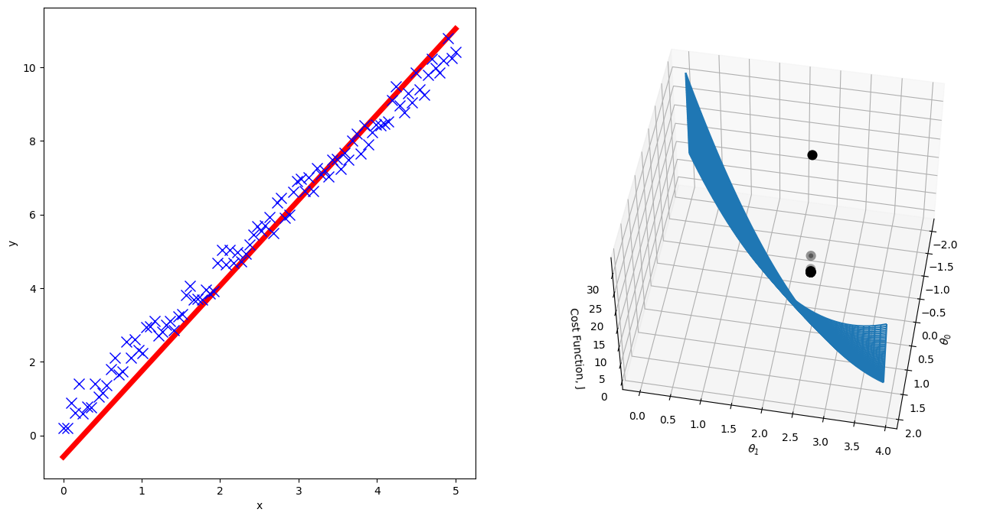

-0.5474634332500437


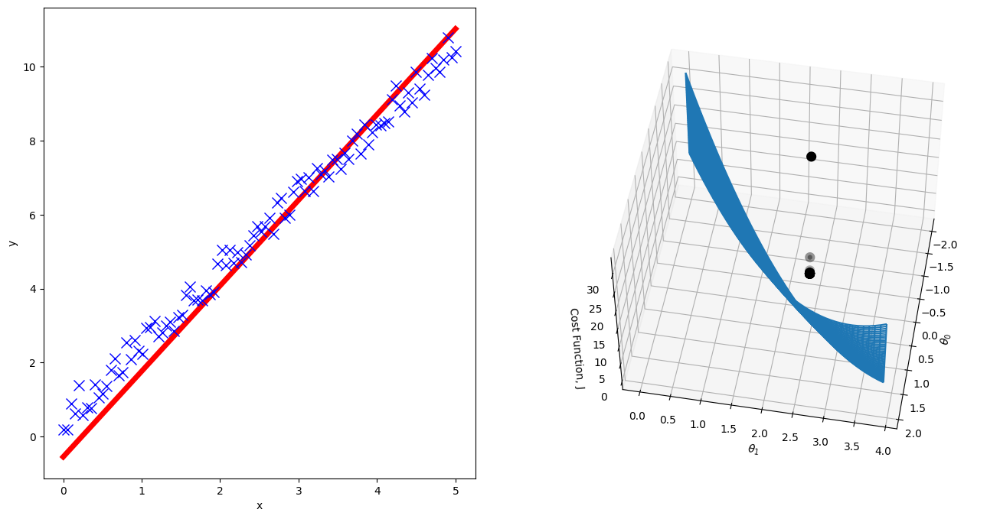

-0.5138257038377106


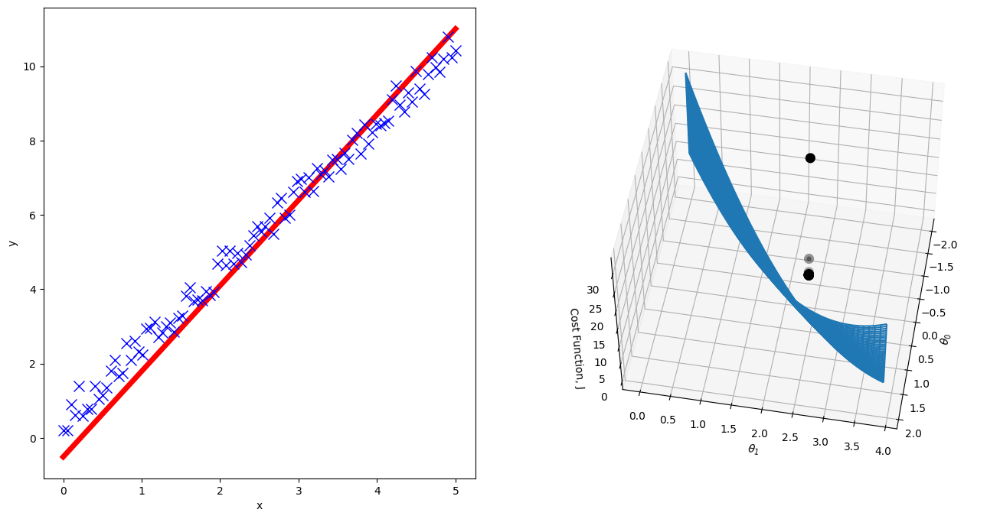

-0.48136041392058404


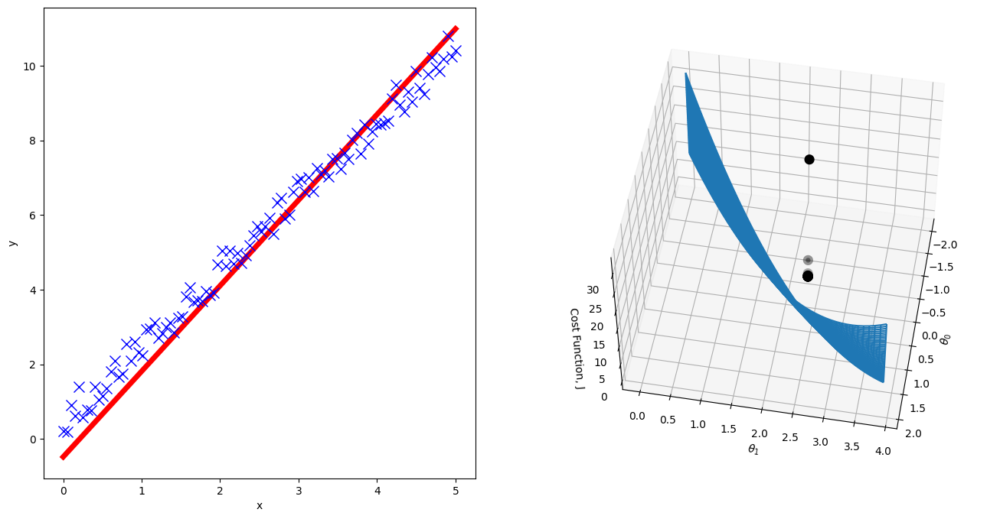

-0.4500273689175164


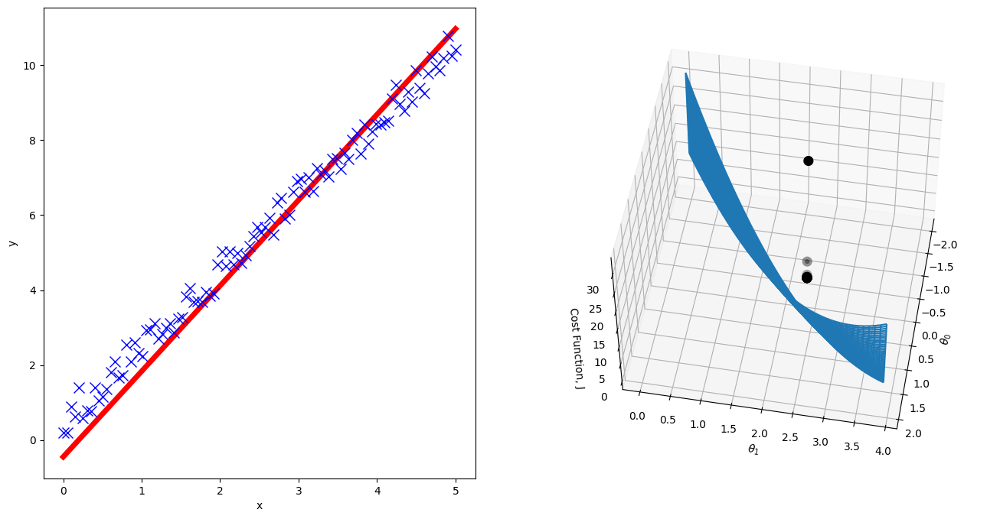

-0.41978683204862416


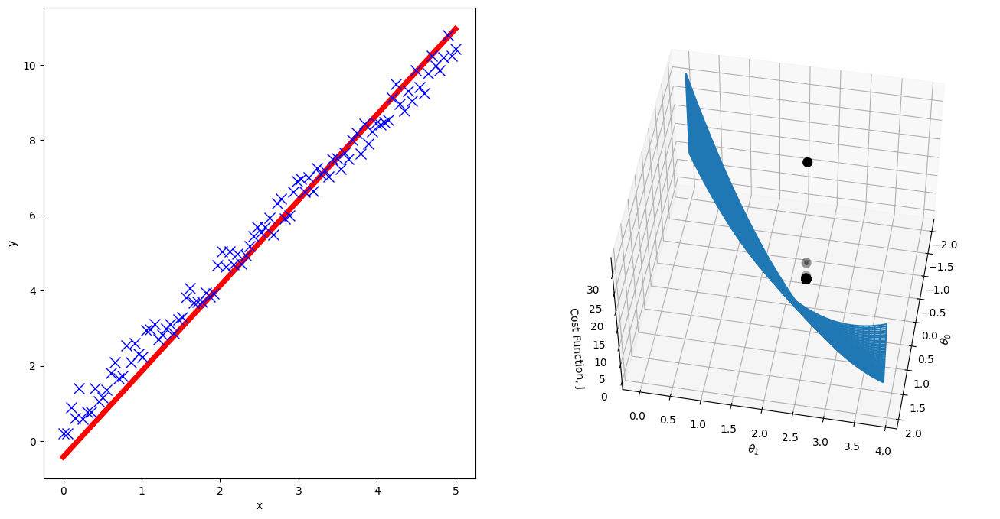

-0.3906008027074005


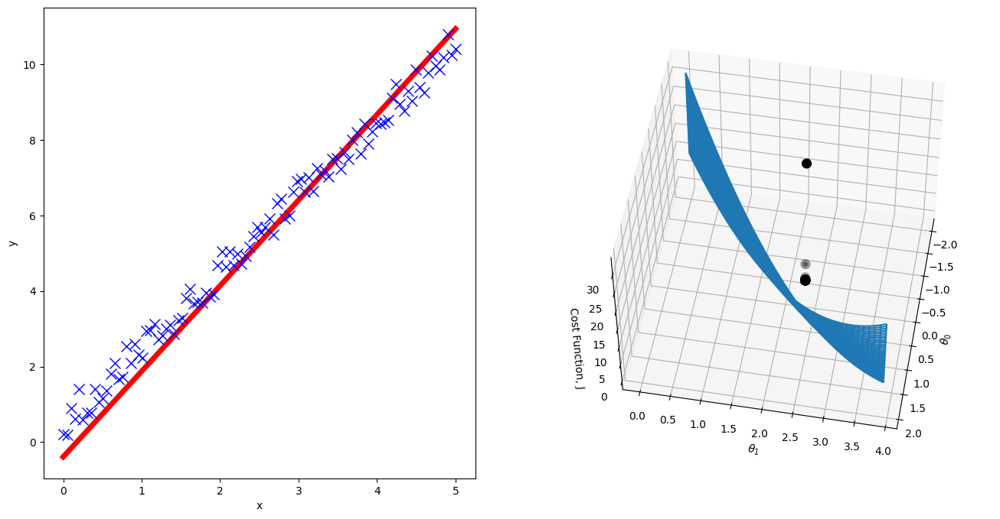

-0.36243247514838073


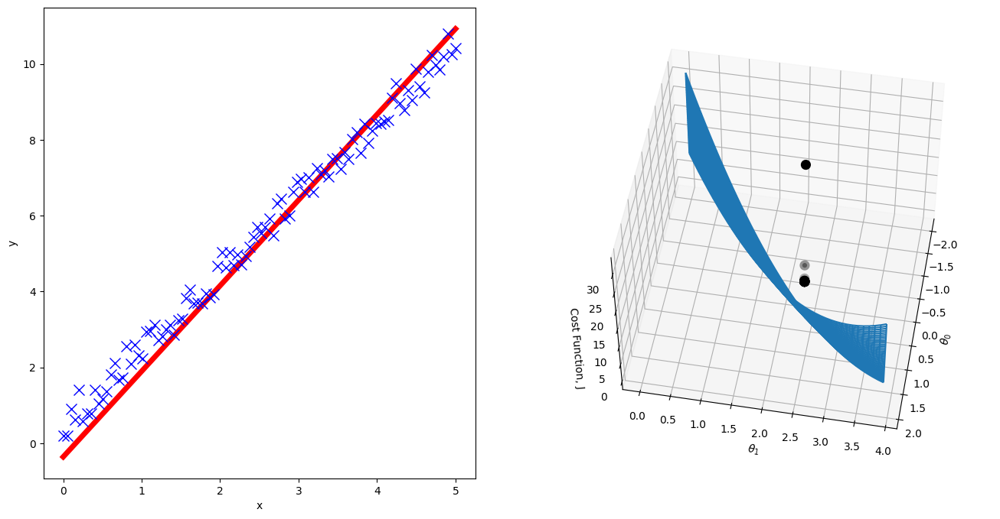

-0.33524637540222163


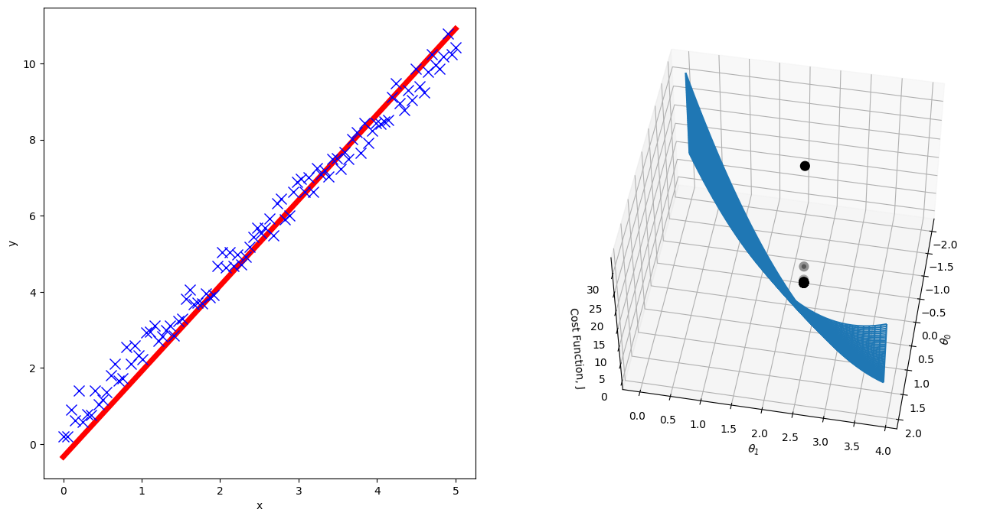

-0.30900824850469816


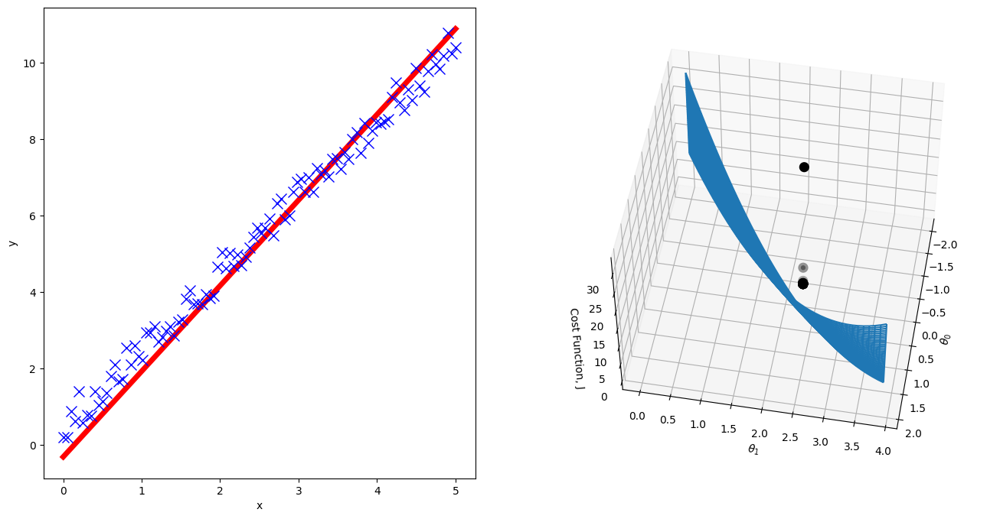

-0.28368504062888533


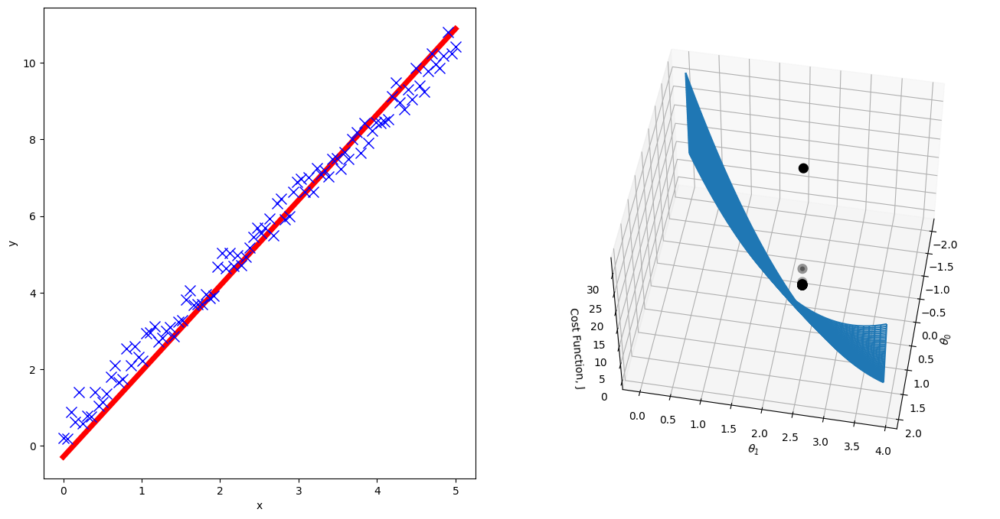

-0.2592448480498619


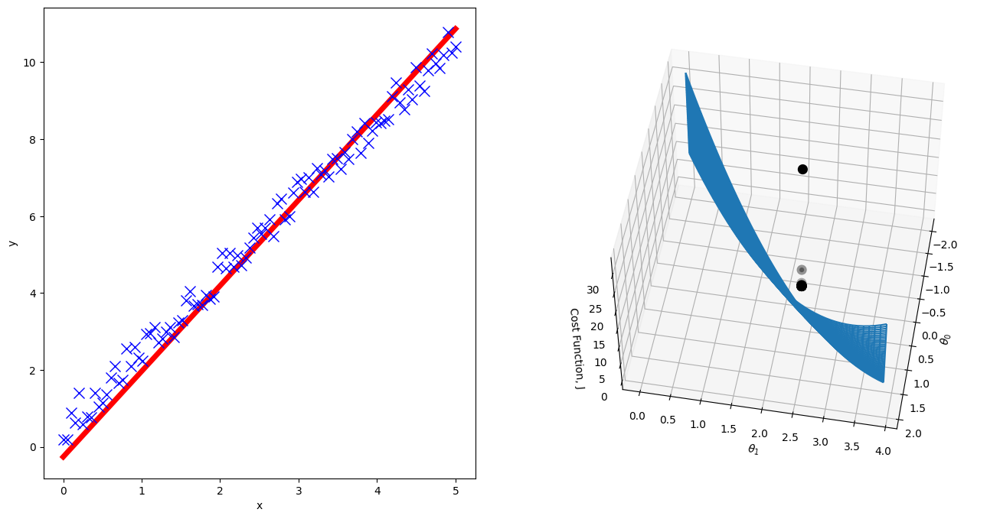

-0.23565688044026983


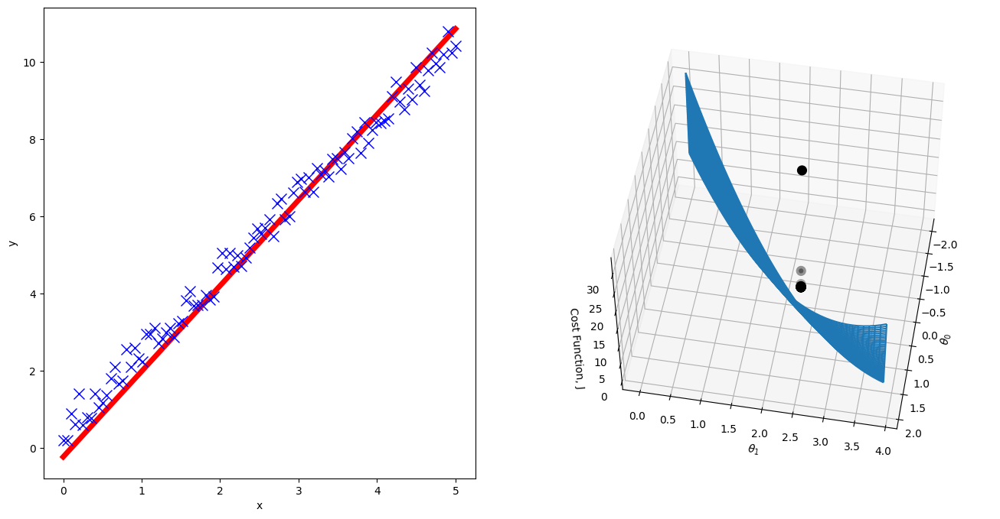

-0.21289142078366693


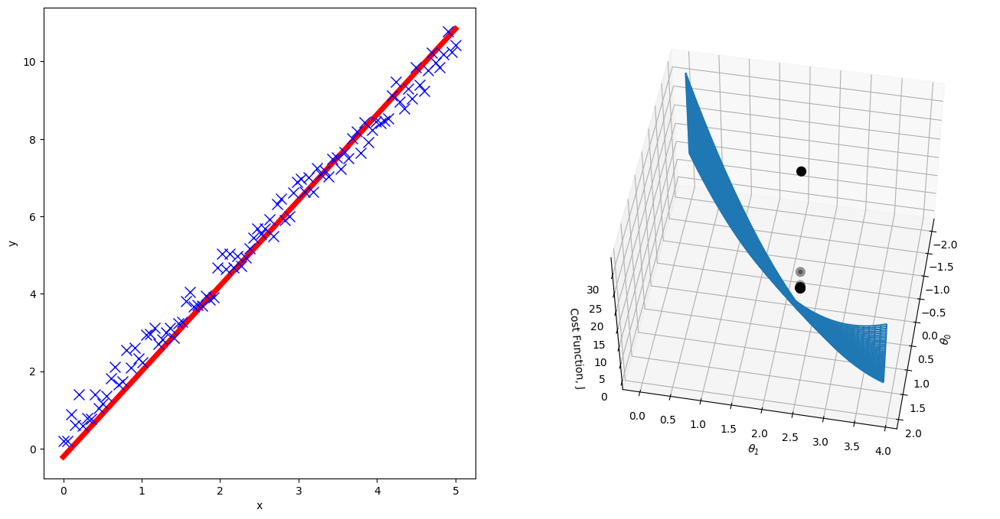

-0.19091978841739413


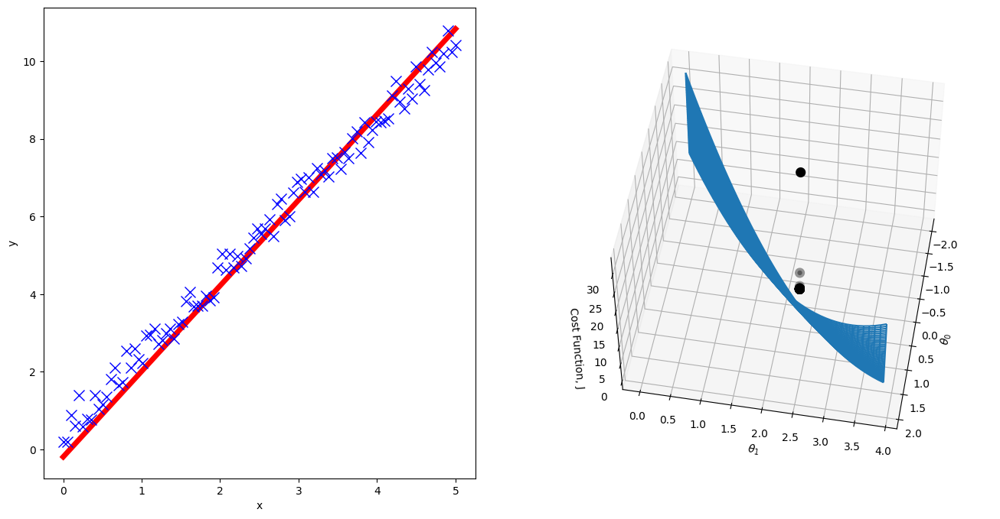

-0.16971430272090096


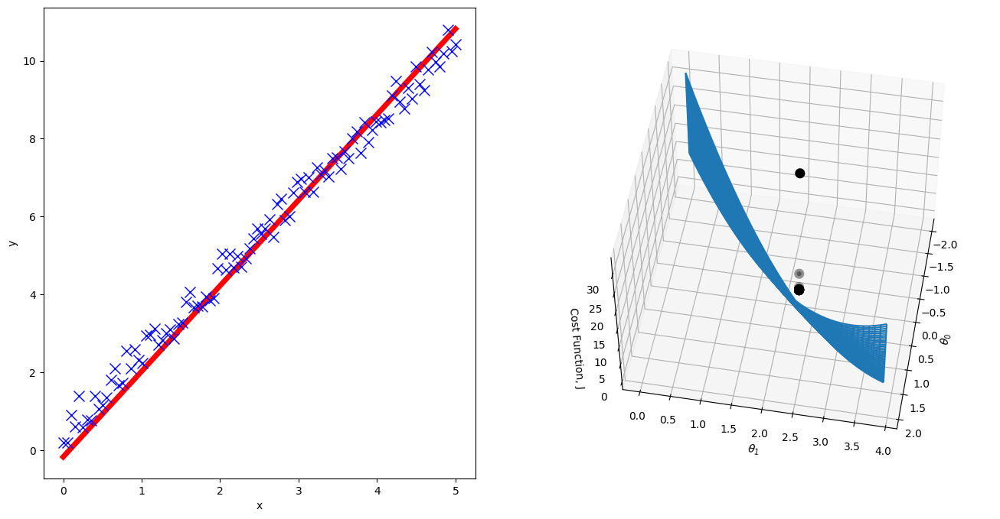

-0.1492482483091775


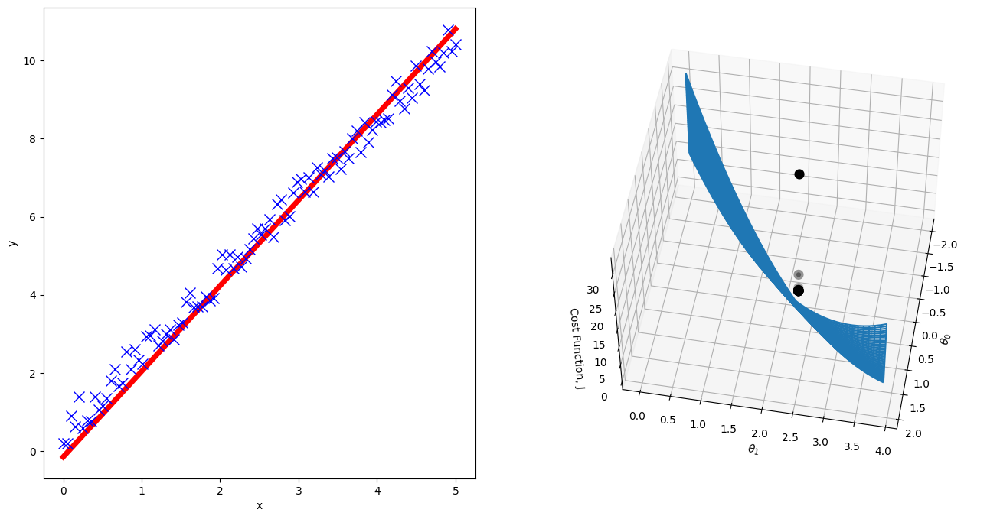

-0.12949584135113554


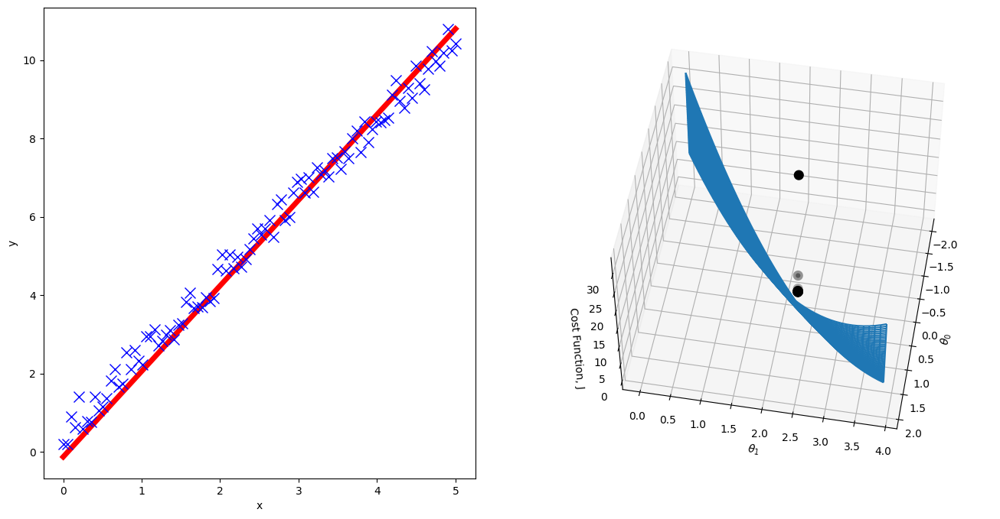

-0.11043219709542872


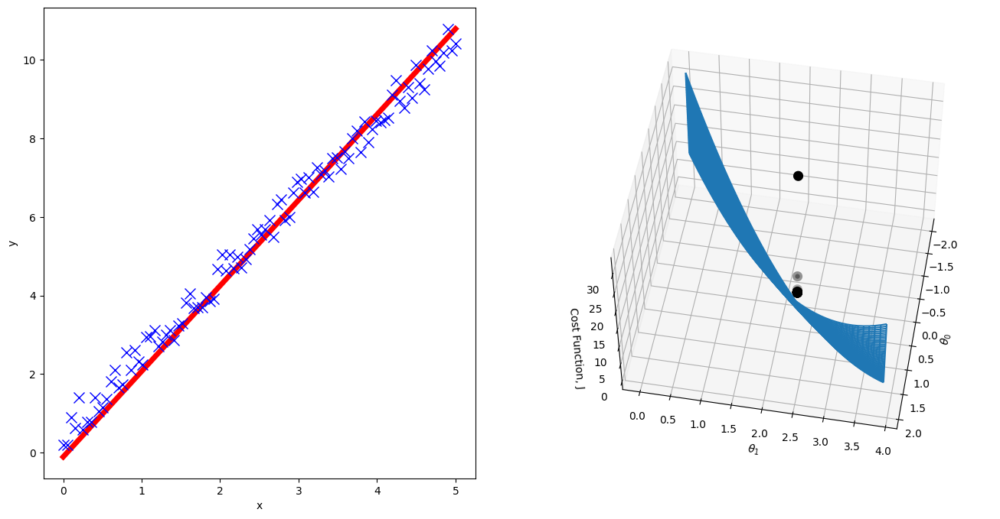

-0.09203329851639404


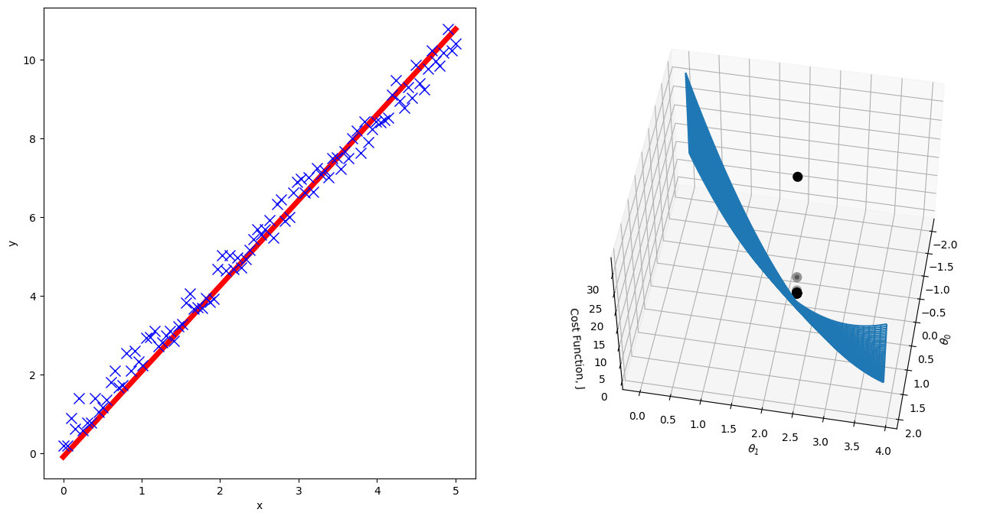

-0.0742759660578541


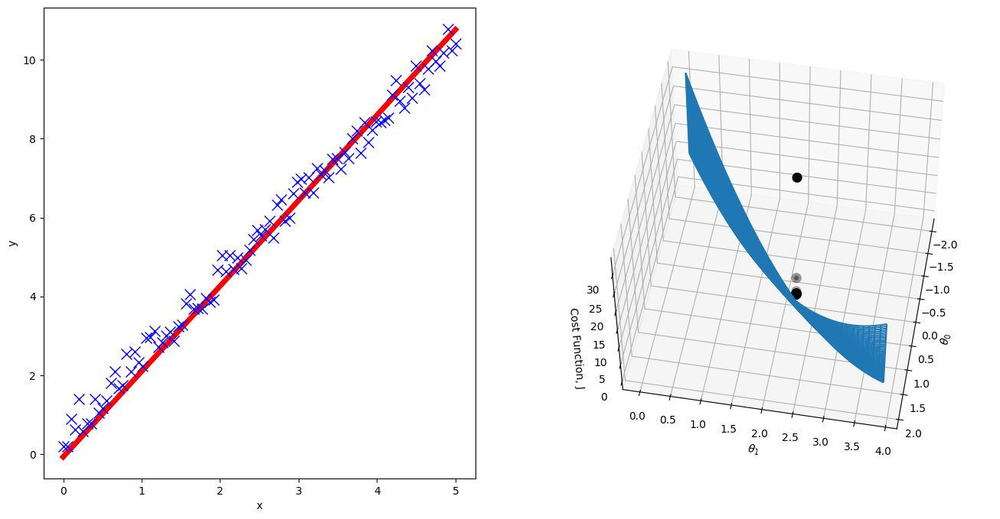

-0.05713782843025557


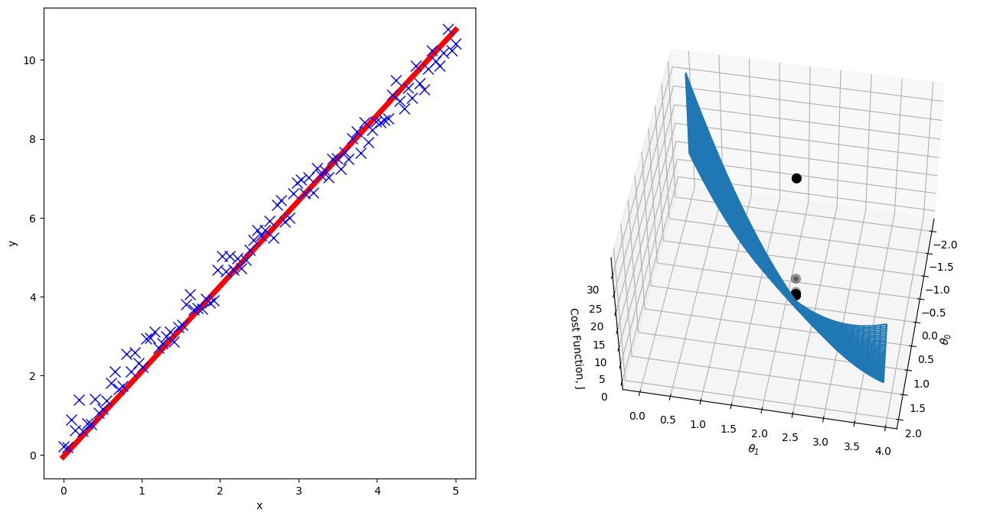

-0.040597294426735715


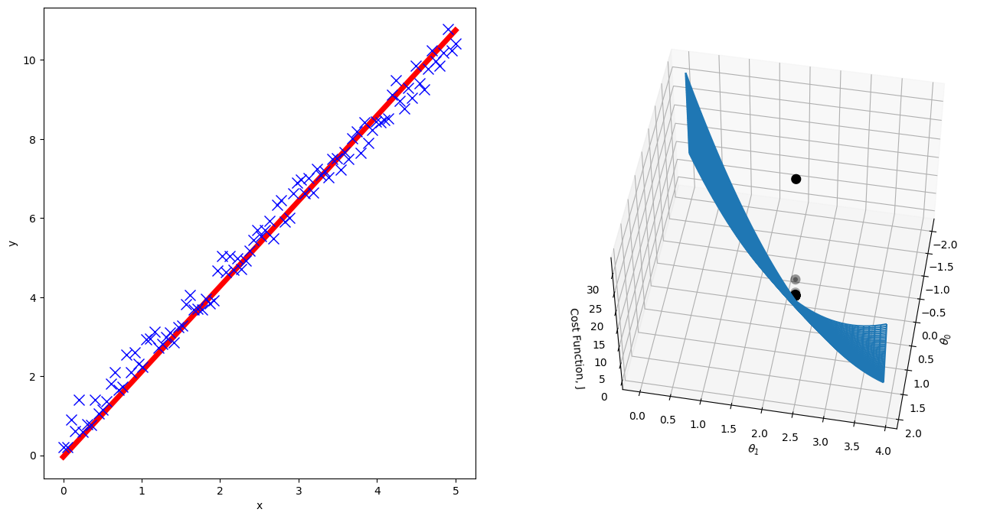

-0.024633525721721897


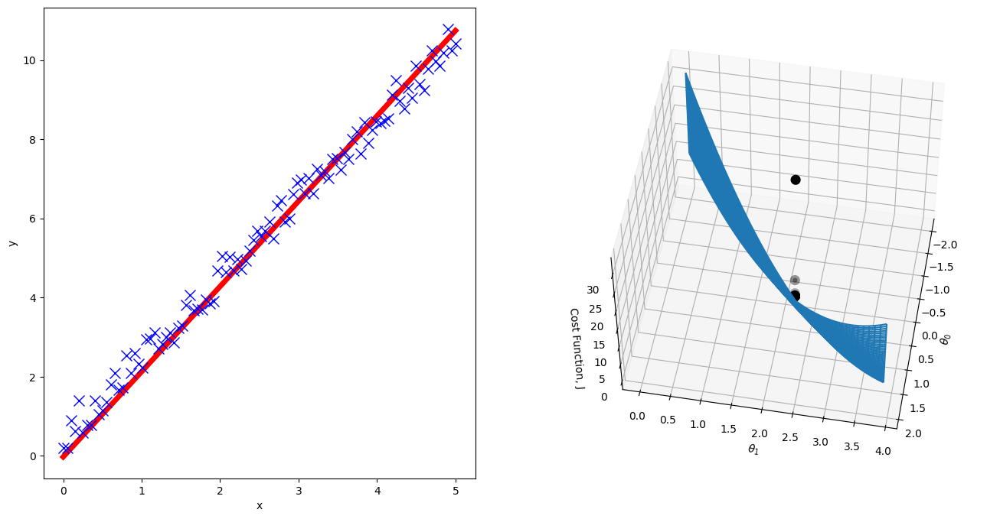

-0.009226410618127293


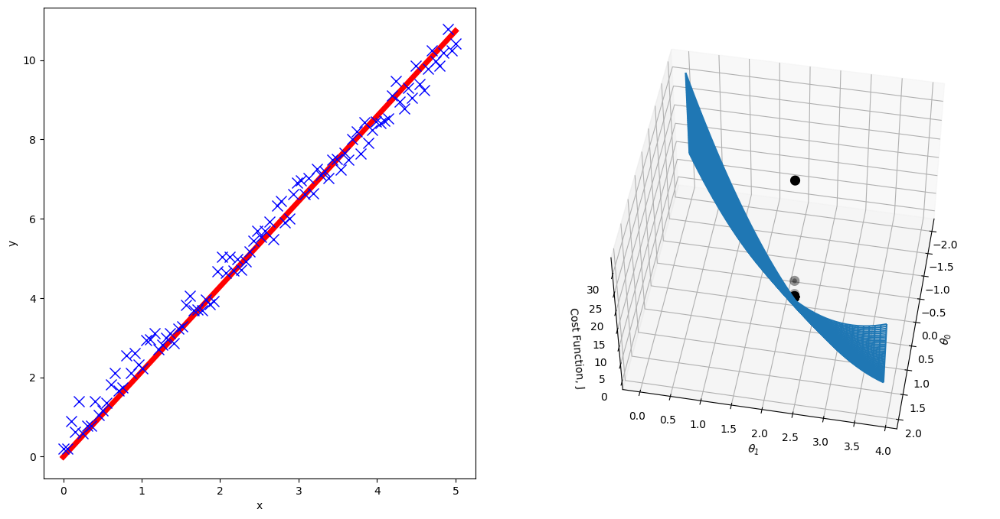

0.005643461290055971


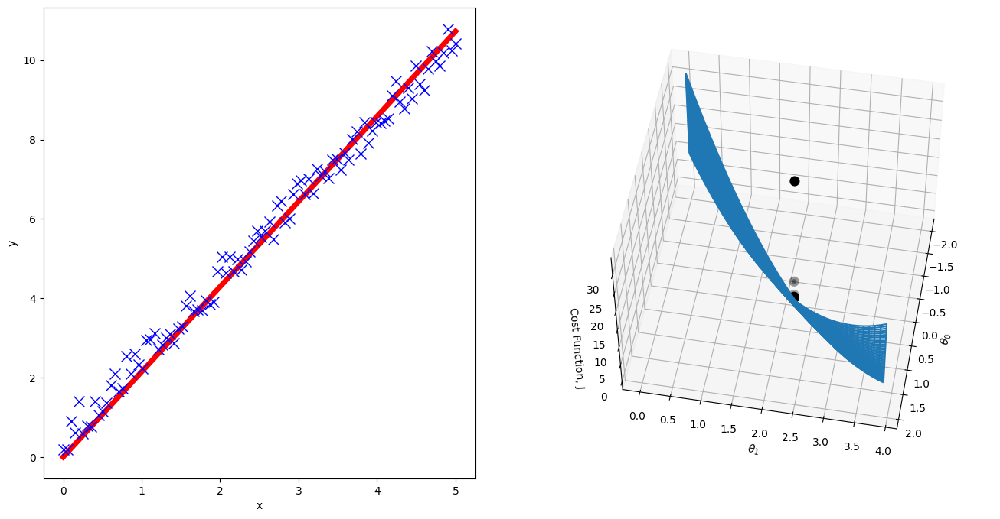

0.019994823571641625


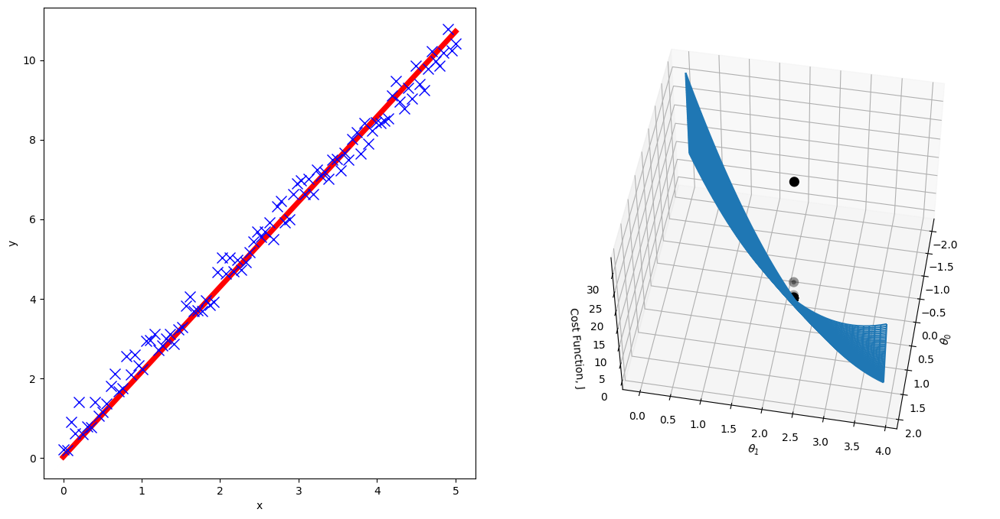

0.03384575655943521


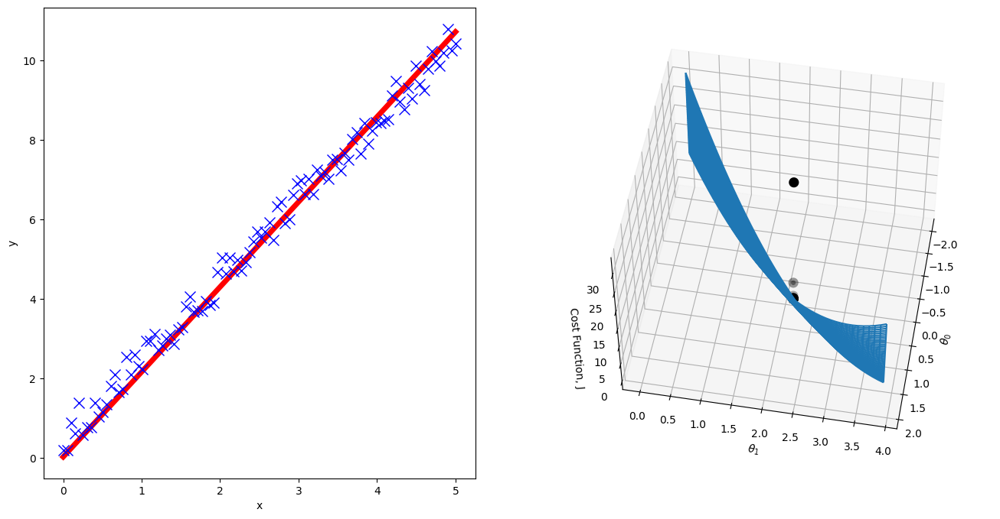

0.04721371012845012


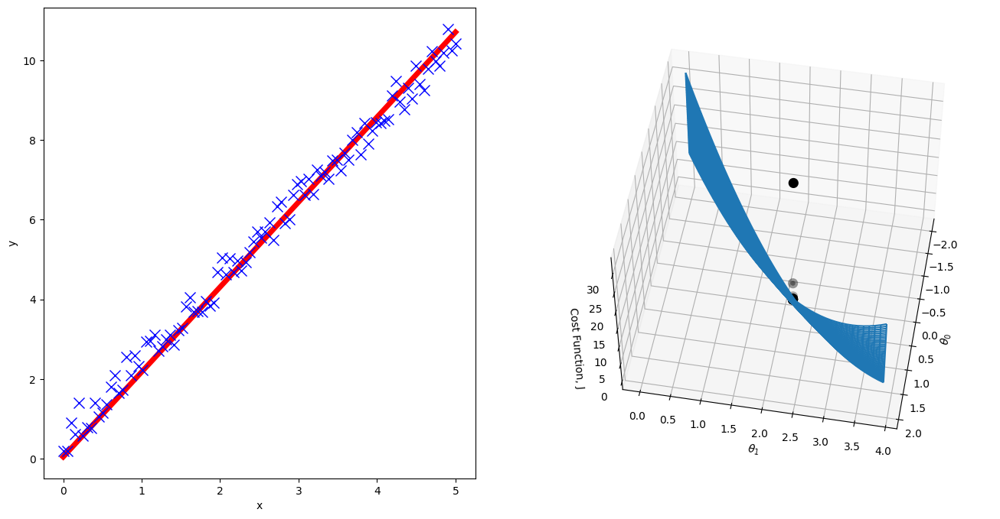

0.06011552567985177


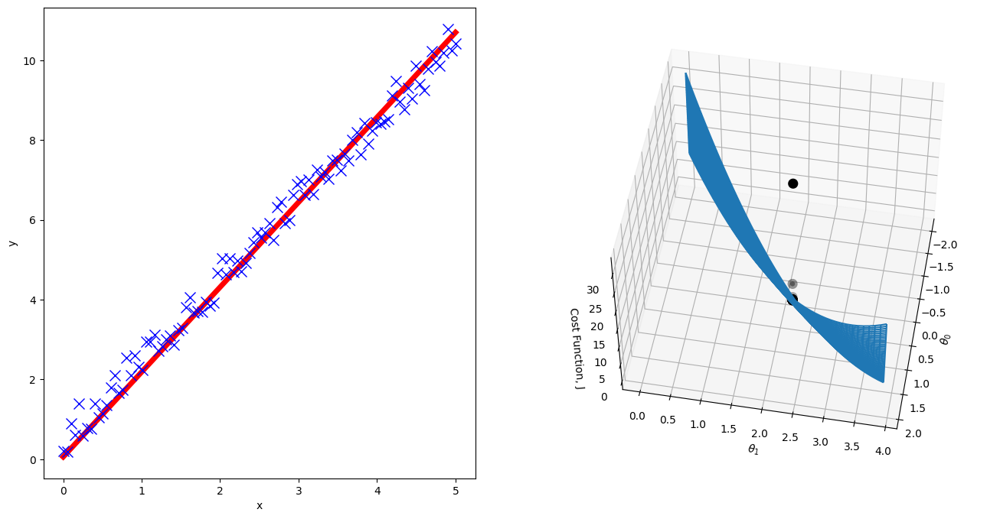

0.0725674573583261


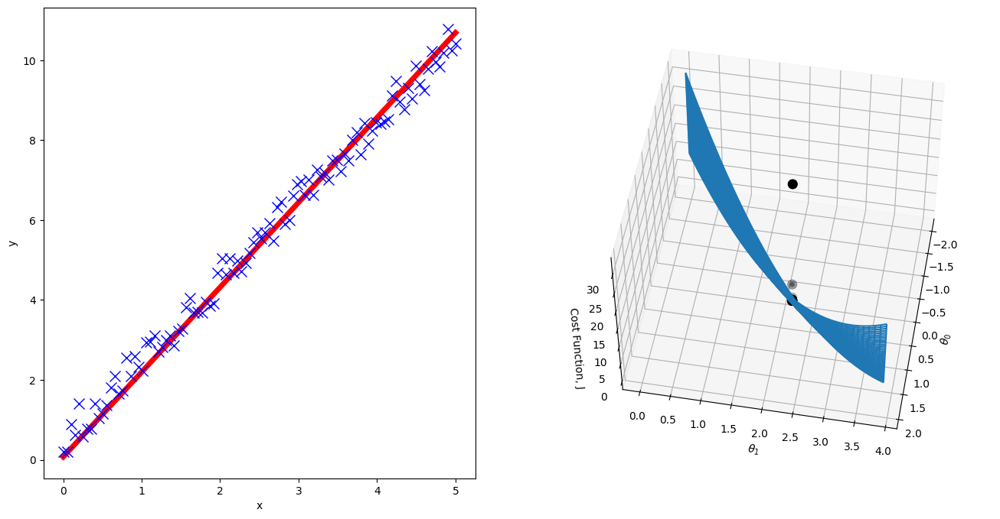

0.08458519252960169


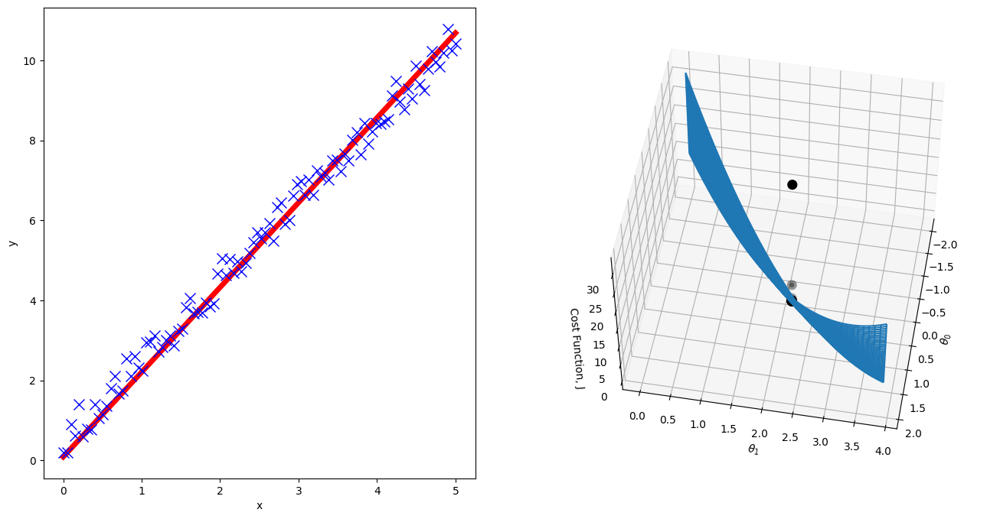

0.09618387154392576


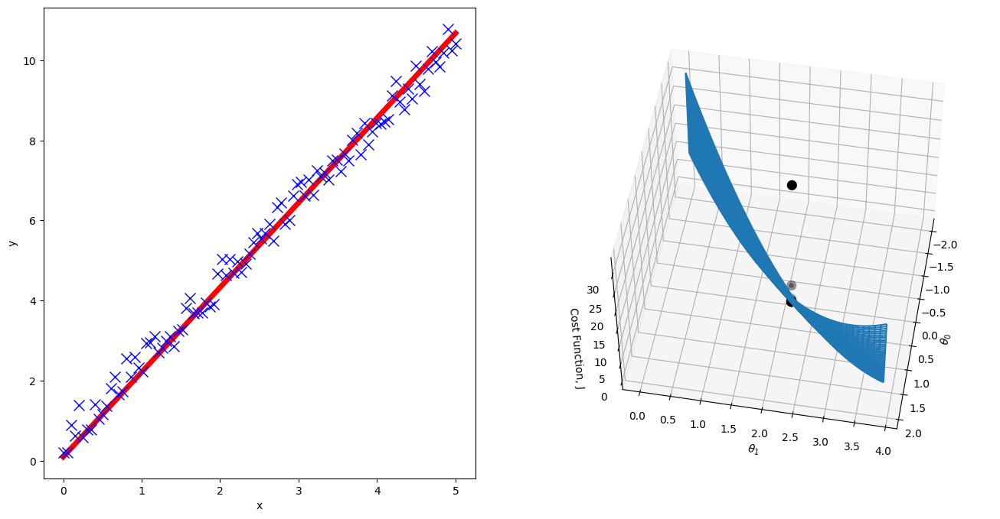

0.10737810681038988


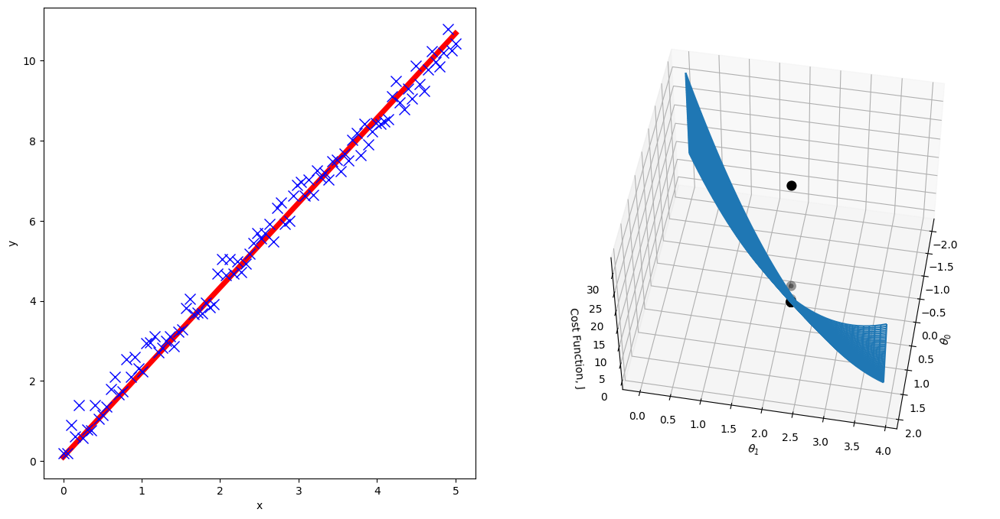

0.1181820012061389


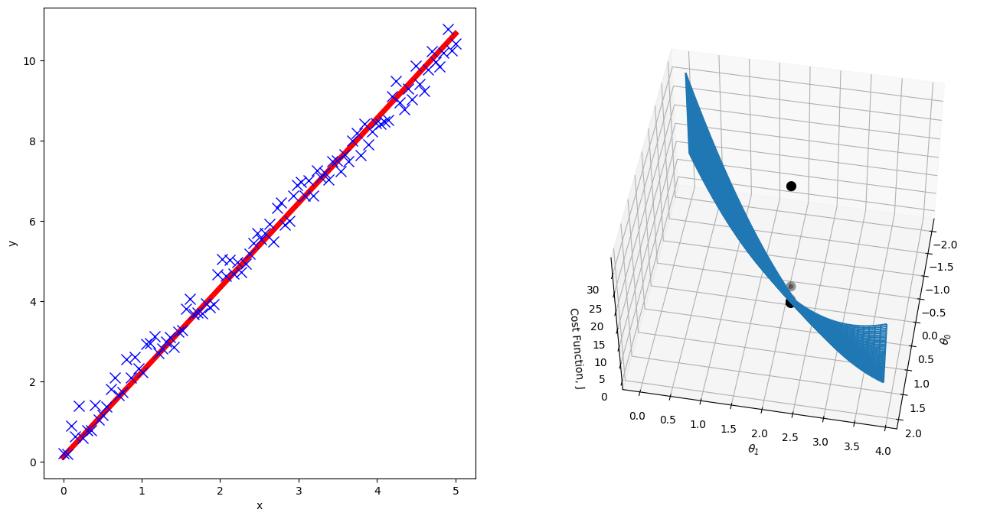

0.12860916584365434


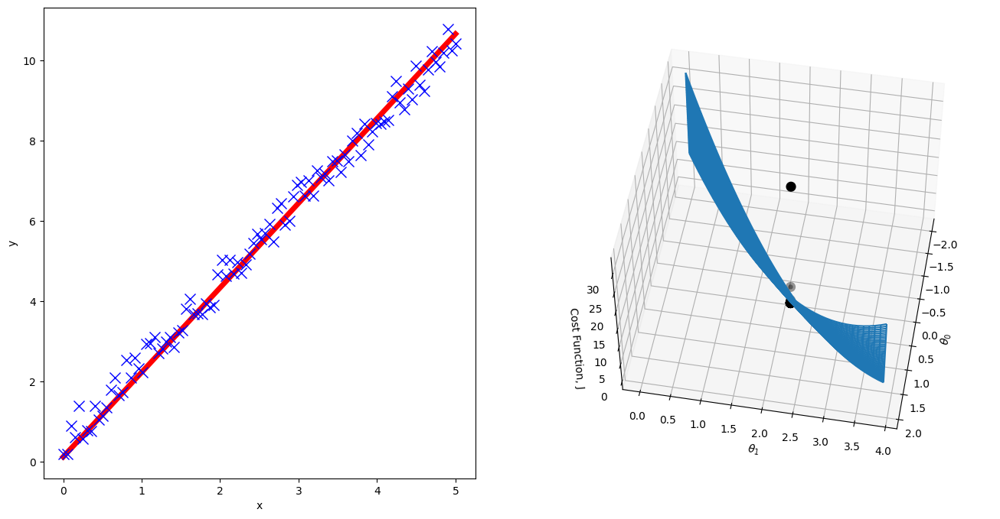

In [12]:
iter = 51
learning_rate = 0.15
time = 0.1

init0 = -2  # possible values -2,2,0.1
init1 = 0   # possible values 0,4,0.1

Jcost = gradient_descent(x,y,init0,init1,iter,learning_rate,time)

*Video 2.5. Using gradient descent to determine the optimum value of the cost function.*

We can plot the cost function and see how it decreases per iteration.

Text(0, 0.5, 'Cost Function, J')

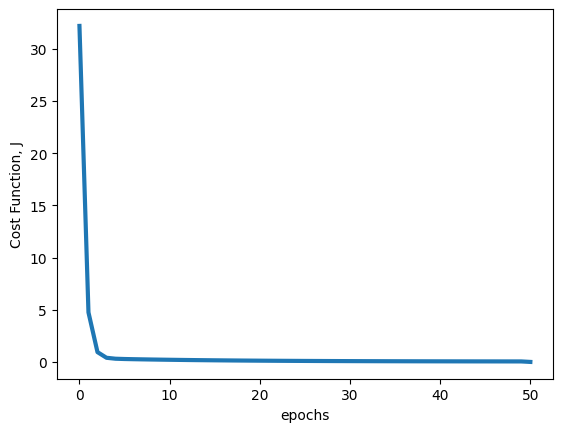

In [13]:
plt.plot(Jcost,linewidth=3)
plt.xlabel('epochs')
plt.ylabel('Cost Function, J')

*Figure 2.3. The decrease of the cost function is seen with the number of iterations or epochs.*

##**The Learning Rate**


The basic algorithm for the gradient descent can be written as<br>
$iterate \{ \theta_i - \alpha \frac{\partial J(\theta_0,\theta_1)}{\partial \theta_i} \rightarrow \theta_i \}_{i=0,1}$.<br>
You might notice that there is a parameter, $\alpha$. This parameter is called a learning rate. It's a parameter that when properly chosen, the function converges to the optimum value quickly. Otherwise, the convergence will be too slow or it might not converge at all. Using the same code we used earlier, try to change the learning rate to a smaller value and then to a larger value to see what happens.<br>
In choosing the learning rate, you want a relatively smooth decrease of the cost function with the number of iterations.